VD 

In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import math
import plotly.graph_objs as go
%pylab inline

circuits = pd.read_csv("circuits.csv")
constructor_results = pd.read_csv("constructor_results.csv")
constructor_standings = pd.read_csv("constructor_standings.csv")
constructors = pd.read_csv("constructors.csv")
driver_standings = pd.read_csv("driver_standings.csv")
drivers = pd.read_csv("drivers.csv")
lap_times = pd.read_csv("lap_times.csv")
pit_stops = pd.read_csv("pit_stops.csv")
qualifying =pd.read_csv("qualifying.csv")
races = pd.read_csv("races.csv")
results = pd.read_csv("results.csv")
seasons = pd.read_csv("seasons.csv")
sprint_results = pd.read_csv("sprint_results.csv")
status = pd.read_csv("status.csv")



Populating the interactive namespace from numpy and matplotlib


In [37]:
df = pd.merge(lap_times,drivers[['driverId','code','driverRef']],how='left',on='driverId')
df = pd.merge(df,races[['raceId','name','date','year']],how='left',on='raceId')
df

,raceId,driverId,lap,position,time,milliseconds,code,driverRef,name,date,year
0,841,20,1,1,1:38.109,98109,VET,vettel,Australian Grand Prix,2011-03-27,2011
1,841,20,2,1,1:33.006,93006,VET,vettel,Australian Grand Prix,2011-03-27,2011
2,841,20,3,1,1:32.713,92713,VET,vettel,Australian Grand Prix,2011-03-27,2011
3,841,20,4,1,1:32.803,92803,VET,vettel,Australian Grand Prix,2011-03-27,2011
4,841,20,5,1,1:32.342,92342,VET,vettel,Australian Grand Prix,2011-03-27,2011
...,...,...,...,...,...,...,...,...,...,...,...
528780,1086,842,65,13,1:25.989,85989,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022
528781,1086,842,66,12,1:25.187,85187,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022
528782,1086,842,67,12,1:47.355,107355,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022
528783,1086,842,68,12,1:37.587,97587,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022


In [38]:
df2 = df
#df2 = pd.merge(lap_times,drivers[['driverId','code','driverRef']],how='left',on='driverId')
df2 = pd.merge(df2,driver_standings[['driverStandingsId','raceId','points']],how='left',on='raceId')
#df2
df_2019_2 = df2[df2['year'] == 2019]
df_2019_2


,raceId,driverId,lap,position,time,milliseconds,code,driverRef,name,date,year,driverStandingsId,points
10065278,1010,822,1,1,1:33.813,93813,BOT,bottas,Australian Grand Prix,2019-03-17,2019,69768,0.0
10065279,1010,822,1,1,1:33.813,93813,BOT,bottas,Australian Grand Prix,2019-03-17,2019,69767,0.0
10065280,1010,822,1,1,1:33.813,93813,BOT,bottas,Australian Grand Prix,2019-03-17,2019,69766,0.0
10065281,1010,822,1,1,1:33.813,93813,BOT,bottas,Australian Grand Prix,2019-03-17,2019,69765,0.0
10065282,1010,822,1,1,1:33.813,93813,BOT,bottas,Australian Grand Prix,2019-03-17,2019,69764,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10537773,1030,842,53,18,1:42.414,102414,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019,69744,0.0
10537774,1030,842,53,18,1:42.414,102414,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019,69745,1.0
10537775,1030,842,53,18,1:42.414,102414,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019,69746,8.0
10537776,1030,842,53,18,1:42.414,102414,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019,69747,54.0


In [39]:
driver_position = drivers.merge(driver_standings,left_on='driverId',right_on='driverId',how = 'left')
driver_position = driver_position.merge(races,on = 'raceId',how = 'left')
#driver_position

In [40]:
historic_points = df_2019_2.groupby('driverRef').agg({'points':'sum'}).sort_values('points',ascending=False).reset_index().head(10)
#historic_points

In [41]:
driver_standings

,driverStandingsId,raceId,driverId,points,position,positionText,wins
0,1,18,1,10.0,1,1,1
1,2,18,2,8.0,2,2,0
2,3,18,3,6.0,3,3,0
3,4,18,4,5.0,4,4,0
4,5,18,5,4.0,5,5,0
...,...,...,...,...,...,...,...
33681,71559,1086,807,0.0,21,21,0
33682,71560,1086,815,173.0,3,3,1
33683,71561,1086,830,258.0,1,1,8
33684,71562,1086,842,16.0,13,13,0


In [42]:
# For Final Position Per Race

df_results = results
df_results = df_results.merge(drivers[['driverId','code','driverRef']],how='left',on='driverId')
df_results = df_results.merge(races[['raceId','name','date','year']],how='left',on='raceId')

df_results.drop_duplicates(inplace=True)

df_results[df_results['position']==r'\N']=0
df_results['position'] = df_results['position'].astype(int)

In [43]:
## For Season points per race 
#driver_standings
season_Points =driver_standings

#a.info()

season_Points = season_Points.merge(drivers[['driverId','code','driverRef']],how='left',on='driverId')
season_Points1 = season_Points
season_Points1 = season_Points1.merge(races[['raceId','name','date','year']],how='left',on='raceId')
#a1.info()
season_Points_2019 = season_Points1
season_Points_2020 = season_Points1
season_Points_2021 = season_Points1
season_Points_2022 = season_Points1

season_Points_2019 = season_Points_2019[(season_Points_2019['year']==2019)&((season_Points_2019['code']=='VER')|(season_Points_2019['code']=='GAS')|
                                                             (season_Points_2019['code']=='ALB')|(season_Points_2019['code']=='PER'))]
season_Points_2020 = season_Points_2020[(season_Points_2020['year']==2020)&((season_Points_2020['code']=='VER')|(season_Points_2020['code']=='GAS')|
                                            (season_Points_2020['code']=='ALB')|(season_Points_2020['code']=='PER'))]
season_Points_2021 = season_Points_2021[(season_Points_2021['year']==2021)&((season_Points_2021['code']=='VER')|
                                (season_Points_2021['code']=='GAS')|(season_Points_2021['code']=='ALB')|(season_Points_2021['code']=='PER'))]
season_Points_2022 = season_Points_2022[(season_Points_2022['year']==2022)&((season_Points_2022['code']=='VER')|
                                                                            (season_Points_2022['code']=='GAS')|(season_Points_2022['code']=='ALB')|(season_Points_2022['code']=='PER'))]
season_Points_2019.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 84 entries, 32152 to 32559
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   driverStandingsId  84 non-null     int64  
 1   raceId             84 non-null     int64  
 2   driverId           84 non-null     int64  
 3   points             84 non-null     float64
 4   position           84 non-null     int64  
 5   positionText       84 non-null     object 
 6   wins               84 non-null     int64  
 7   code               84 non-null     object 
 8   driverRef          84 non-null     object 
 9   name               84 non-null     object 
 10  date               84 non-null     object 
 11  year               84 non-null     int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 8.5+ KB


## 2019
##### Verstappen - Main driver
##### Gasly - Second driver
##### Albon - Toro roso

In [44]:
# df 2019 season
df_2019 = df[df['year'] == 2019]
df_2019

,raceId,driverId,lap,position,time,milliseconds,code,driverRef,name,date,year
448879,1010,822,1,1,1:33.813,93813,BOT,bottas,Australian Grand Prix,2019-03-17,2019
448880,1010,822,2,1,1:29.662,89662,BOT,bottas,Australian Grand Prix,2019-03-17,2019
448881,1010,822,3,1,1:29.246,89246,BOT,bottas,Australian Grand Prix,2019-03-17,2019
448882,1010,822,4,1,1:28.641,88641,BOT,bottas,Australian Grand Prix,2019-03-17,2019
448883,1010,822,5,1,1:28.759,88759,BOT,bottas,Australian Grand Prix,2019-03-17,2019
...,...,...,...,...,...,...,...,...,...,...,...
472499,1030,842,49,18,1:43.719,103719,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019
472500,1030,842,50,18,1:42.820,102820,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019
472501,1030,842,51,18,1:42.814,102814,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019
472502,1030,842,52,18,1:45.254,105254,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019


In [45]:
#df_2019.info()

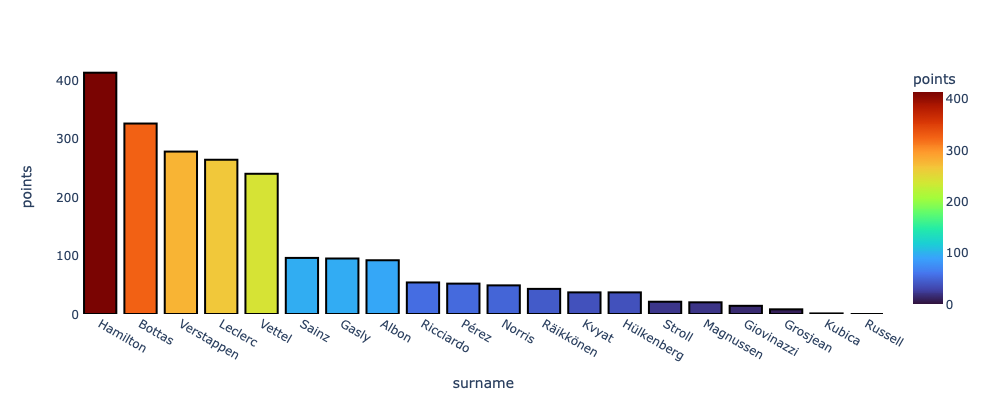

In [62]:
# 2019 ALL Drivers Standings 

h = driver_position.merge(circuits,left_on='circuitId',right_on='circuitId',how = 'left')
h.rename(columns={'name_y':'circuit_name'},inplace=True)
viz = h.loc[:,['date','year','circuit_name','surname','points','wins']]

viz.dropna(inplace = True)

viz.points = viz.points.astype('int64')
viz.wins = viz.wins.astype('int64')
viz.date = pd.to_datetime(viz.date)
    
top = viz[viz.loc[:,'year'] == 2019]
top = top.groupby(['surname'])[['points','wins']].max().sort_values('points',ascending = False).head(20).reset_index()

fig = px.bar(top, x='surname', y='points',hover_data=['wins'], color='points',height=400,color_continuous_scale= 'turbo')
fig.update_traces(textfont_size=20,marker=dict(line=dict(color='#000000', width=2)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})

fig.show()

In [47]:
# 2019 with just RB drivers(RB & Toro roso)

indexRB_2019 = df_2019[ (df_2019['code'] != 'VER') & (df_2019['code'] != 'GAS')  & (df_2019['code'] != 'ALB')].index

df_2019.drop(indexRB_2019 , inplace=True)
df_2019

/Users/diogodoria/opt/anaconda3/lib/python3.9/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,raceId,driverId,lap,position,time,milliseconds,code,driverRef,name,date,year
449053,1010,830,1,4,1:36.291,96291,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019
449054,1010,830,2,4,1:30.053,90053,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019
449055,1010,830,3,4,1:29.370,89370,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019
449056,1010,830,4,4,1:29.301,89301,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019
449057,1010,830,5,4,1:29.723,89723,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019
...,...,...,...,...,...,...,...,...,...,...,...
472499,1030,842,49,18,1:43.719,103719,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019
472500,1030,842,50,18,1:42.820,102820,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019
472501,1030,842,51,18,1:42.814,102814,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019
472502,1030,842,52,18,1:45.254,105254,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019


In [48]:
# df Every lap of every GP 2019 SEASON

df_laps = df[(df['year']==2019)&((df['code']=='VER')|(df['code']=='GAS'))|(df['driverRef']=='albon')].copy()
df_laps.rename(columns={'position':'lap position'},inplace=True)
df_laps = df_laps.merge(results[['raceId','driverId','position']],how='left',on=['raceId','driverId'])
df_laps = df_laps.merge(pit_stops[['raceId','driverId','lap','stop']],how='left',on=['raceId','driverId','lap'])
df_laps['stop'].fillna(0,inplace=True)
df_laps['stop']=df_laps['stop'].astype(int)
df_laps['stop'][df_laps['stop']==0] = ''
df_laps

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_6841/3281109197.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,raceId,driverId,lap,lap position,time,milliseconds,code,driverRef,name,date,year,position,stop
0,1010,830,1,4,1:36.291,96291,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019,3,
1,1010,830,2,4,1:30.053,90053,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019,3,
2,1010,830,3,4,1:29.370,89370,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019,3,
3,1010,830,4,4,1:29.301,89301,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019,3,
4,1010,830,5,4,1:29.723,89723,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019,3,
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5353,1086,848,65,18,1:26.377,86377,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,
5354,1086,848,66,17,1:34.127,94127,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,
5355,1086,848,67,17,1:49.545,109545,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,
5356,1086,848,68,16,1:28.621,88621,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,


In [49]:
# Gran Prixs of 2019 season
df_2019_F = df_laps[(df_laps['year'] == 2019)]
df_2019_F['name'].unique()


array(['Australian Grand Prix', 'Bahrain Grand Prix',
       'Chinese Grand Prix', 'Azerbaijan Grand Prix',
       'Spanish Grand Prix', 'Monaco Grand Prix', 'Canadian Grand Prix',
       'French Grand Prix', 'Austrian Grand Prix', 'British Grand Prix',
       'German Grand Prix', 'Hungarian Grand Prix', 'Belgian Grand Prix',
       'Italian Grand Prix', 'Singapore Grand Prix', 'Russian Grand Prix',
       'Japanese Grand Prix', 'Mexican Grand Prix',
       'United States Grand Prix', 'Brazilian Grand Prix',
       'Abu Dhabi Grand Prix'], dtype=object)

In [50]:
df_2019_F.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3659 entries, 0 to 3658
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   raceId        3659 non-null   int64 
 1   driverId      3659 non-null   int64 
 2   lap           3659 non-null   int64 
 3   lap position  3659 non-null   int64 
 4   time          3659 non-null   object
 5   milliseconds  3659 non-null   int64 
 6   code          3659 non-null   object
 7   driverRef     3659 non-null   object
 8   name          3659 non-null   object
 9   date          3659 non-null   object
 10  year          3659 non-null   int64 
 11  position      3659 non-null   object
 12  stop          3659 non-null   object
dtypes: int64(6), object(7)
memory usage: 400.2+ KB


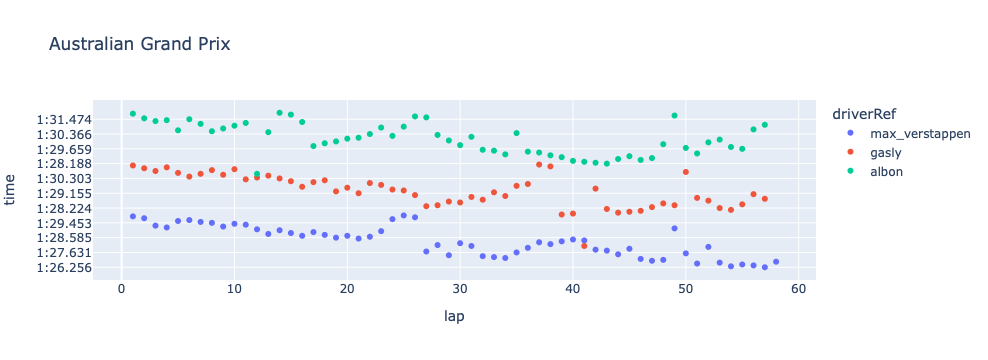

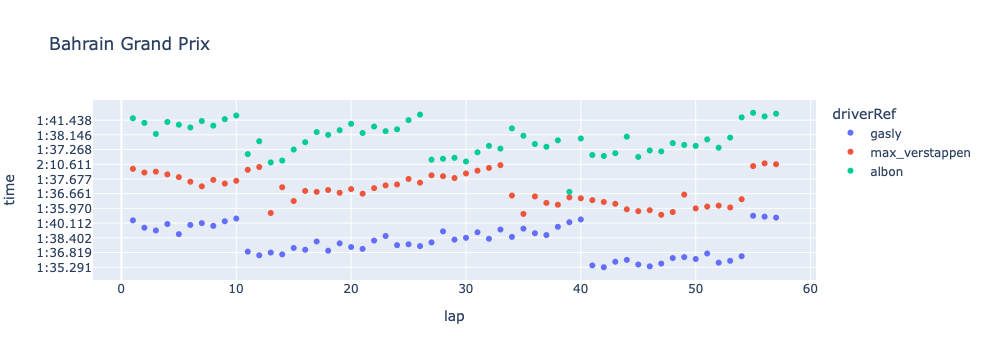

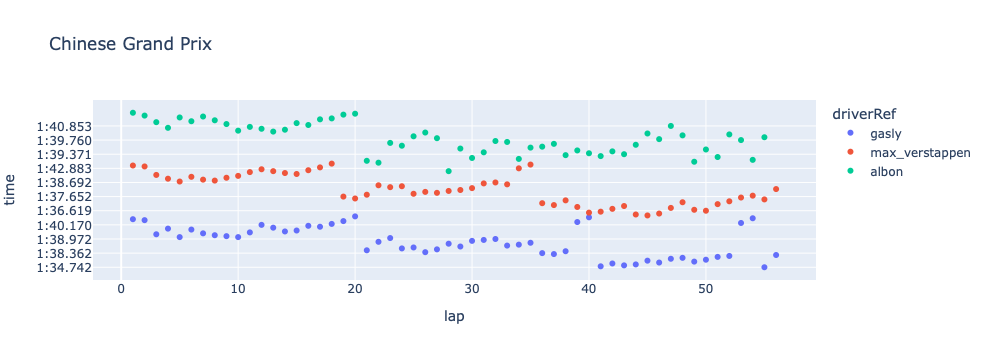

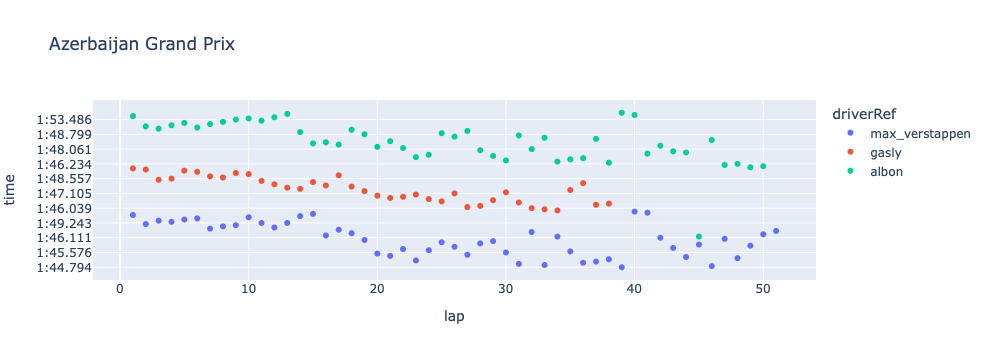

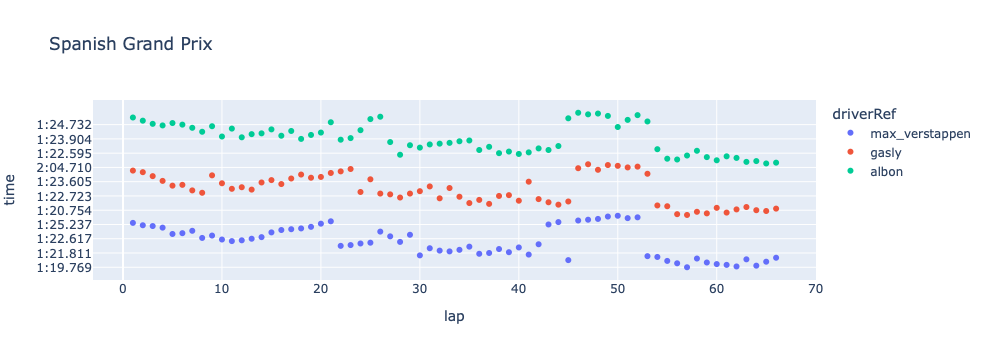

...

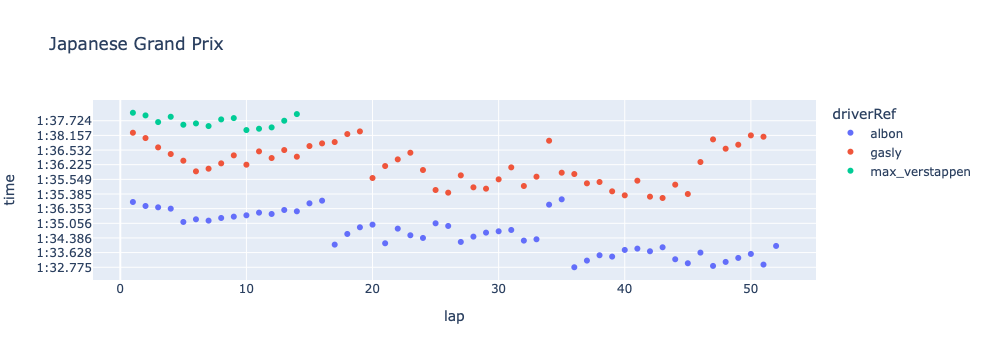

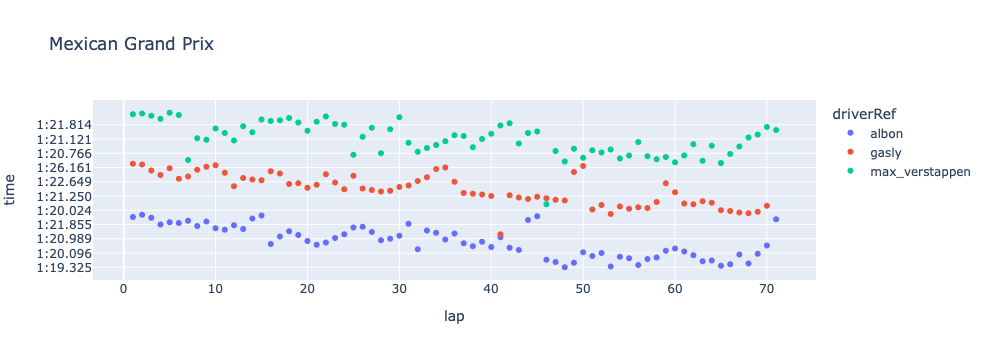

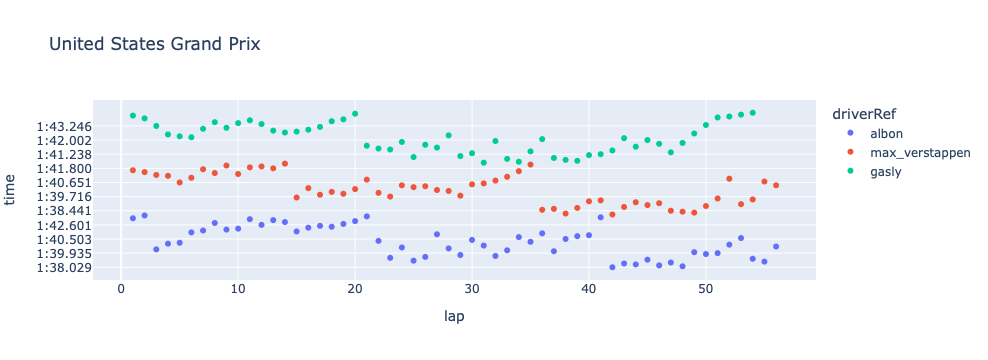

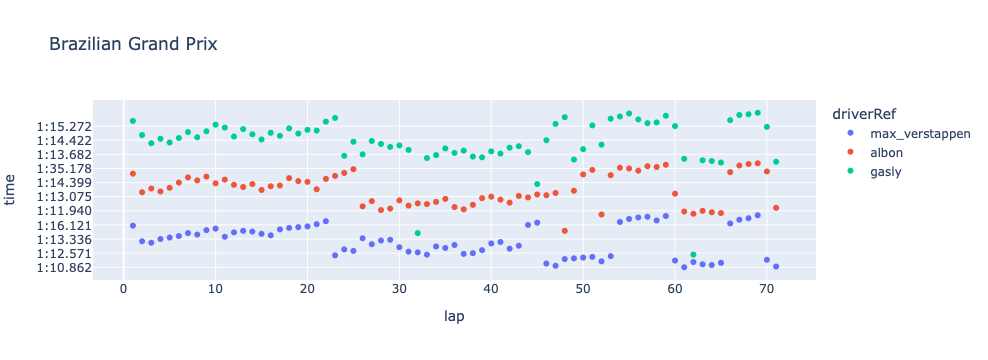

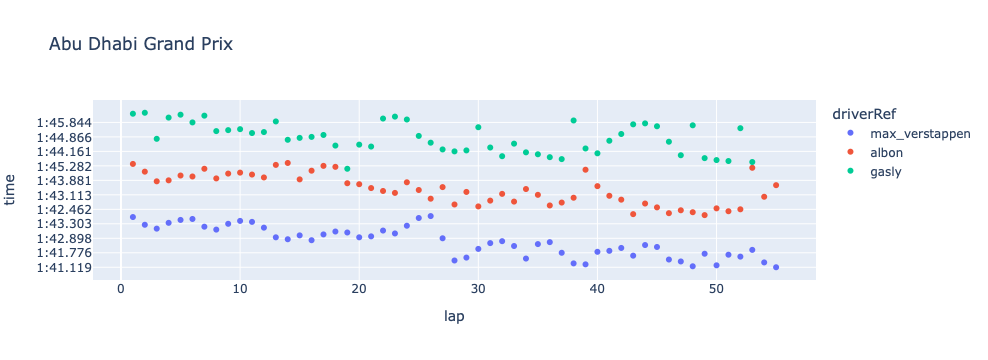

In [51]:
#['Australian Grand Prix', 'Bahrain Grand Prix',
 #      'Chinese Grand Prix', 'Azerbaijan Grand Prix',
  #     'Spanish Grand Prix', 'Monaco Grand Prix', 'Canadian Grand Prix',
   #    'French Grand Prix', 'Austrian Grand Prix', 'British Grand Prix',
    #   'German Grand Prix', 'Hungarian Grand Prix', 'Belgian Grand Prix',
     #  'Italian Grand Prix', 'Singapore Grand Prix', 'Russian Grand Prix',
      # 'Japanese Grand Prix', 'Mexican Grand Prix',
       #'United States Grand Prix', 'Brazilian Grand Prix',
       #'Abu Dhabi Grand Prix']

# Australian Grand Prix

df_2019_F_AUST = df_2019_F[(df_2019_F['name'] == 'Australian Grand Prix')]
df_2019_AUST = df_2019_F_AUST.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_AUST = df_2019_AUST.sort_values(by="time")

fig_2019_1 = px.scatter(df_2019_AUST, x="lap", y="time", color = "driverRef", title = "Australian Grand Prix")
fig_2019_1.update_traces(textposition="bottom right")
fig_2019_1.show()

# Bahrain Grand Prix

df_2019_F_BAH = df_2019_F[(df_2019_F['name'] == 'Bahrain Grand Prix')]
df_2019_BAH = df_2019_F_BAH.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_BAH = df_2019_BAH.sort_values(by="time")

fig_2019_2 = px.scatter(df_2019_BAH, x="lap", y="time", color = "driverRef", title = "Bahrain Grand Prix")
fig_2019_2.update_traces(textposition="bottom right")
fig_2019_2.show()


# Chinese Grand Prix

df_2019_F_CHN = df_2019_F[(df_2019_F['name'] == 'Chinese Grand Prix')]
df_2019_CHN = df_2019_F_CHN.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_CHN = df_2019_CHN.sort_values(by="time")

fig_2019_3 = px.scatter(df_2019_CHN, x="lap", y="time", color = "driverRef", title = "Chinese Grand Prix")
fig_2019_3.update_traces(textposition="bottom right")
fig_2019_3.show()

# Azerbaijan Grand Prix

df_2019_F_AZB = df_2019_F[(df_2019_F['name'] == 'Azerbaijan Grand Prix')]
df_2019_AZB = df_2019_F_AZB.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_AZB = df_2019_AZB.sort_values(by="time")

fig_2019_4 = px.scatter(df_2019_AZB, x="lap", y="time", color = "driverRef", title = "Azerbaijan Grand Prix")
fig_2019_4.update_traces(textposition="bottom right")
fig_2019_4.show()

# Spanish Grand Prix

df_2019_F_SPN = df_2019_F[(df_2019_F['name'] == 'Spanish Grand Prix')]
df_2019_SPN = df_2019_F_SPN.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_SPN = df_2019_SPN.sort_values(by="time")

fig_2019_5 = px.scatter(df_2019_SPN, x="lap", y="time", color = "driverRef", title = "Spanish Grand Prix")
fig_2019_5.update_traces(textposition="bottom right")
fig_2019_5.show()

# Monaco Grand Prix

df_2019_F_MON = df_2019_F[(df_2019_F['name'] == 'Monaco Grand Prix')]
df_2019_MON = df_2019_F_MON.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_MON = df_2019_MON.sort_values(by="time")

fig_2019_6 = px.scatter(df_2019_MON, x="lap", y="time", color = "driverRef", title = "Monaco Grand Prix")
fig_2019_6.update_traces(textposition="bottom right")
fig_2019_6.show()

# Canadian Grand Prix

df_2019_F_CAN = df_2019_F[(df_2019_F['name'] == 'Canadian Grand Prix')]
df_2019_CAN = df_2019_F_CAN.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_CAN = df_2019_CAN.sort_values(by="time")

fig_2019_7 = px.scatter(df_2019_CAN, x="lap", y="time", color = "driverRef", title = "Canadian Grand Prix")
fig_2019_7.update_traces(textposition="bottom right")
fig_2019_7.show()

# French Grand Prix

df_2019_F_FRA = df_2019_F[(df_2019_F['name'] == 'French Grand Prix')]
df_2019_FRA = df_2019_F_FRA.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_FRA = df_2019_FRA.sort_values(by="time")

fig_2019_8 = px.scatter(df_2019_FRA, x="lap", y="time", color = "driverRef", title = "French Grand Prix")
fig_2019_8.update_traces(textposition="bottom right")
fig_2019_8.show()


# Austrian Grand Prix

df_2019_F_AUT = df_2019_F[(df_2019_F['name'] == 'Austrian Grand Prix')]
df_2019_AUT = df_2019_F_AUT.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_AUT = df_2019_AUT.sort_values(by="time")

fig_2019_9 = px.scatter(df_2019_AUT, x="lap", y="time", color = "driverRef", title = "Austrian Grand Prix")
fig_2019_9.update_traces(textposition="bottom right")
fig_2019_9.show()



# British Grand Prix

df_2019_F_BRIT = df_2019_F[(df_2019_F['name'] == 'British Grand Prix')]
df_2019_BRIT = df_2019_F_BRIT.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_BRIT = df_2019_BRIT.sort_values(by="time")

fig_2019_10 = px.scatter(df_2019_BRIT, x="lap", y="time", color = "driverRef", title = "British Grand Prix")
fig_2019_10.update_traces(textposition="bottom right")
fig_2019_10.show()

# German Grand Prix

df_2019_F_GER = df_2019_F[(df_2019_F['name'] == 'German Grand Prix')]
df_2019_GER = df_2019_F_GER.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_GER = df_2019_GER.sort_values(by="time")

fig_2019_11 = px.scatter(df_2019_GER, x="lap", y="time", color = "driverRef", title = "German Grand Prix")
fig_2019_11.update_traces(textposition="bottom right")
fig_2019_11.show()

# Hungarian Grand Prix

df_2019_F_HUN = df_2019_F[(df_2019_F['name'] == 'Hungarian Grand Prix')]
df_2019_HUN = df_2019_F_HUN.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_HUN = df_2019_HUN.sort_values(by="time")

fig_2019_12 = px.scatter(df_2019_HUN, x="lap", y="time", color = "driverRef", title = "Hungarian Grand Prix")
fig_2019_12.update_traces(textposition="bottom right")
fig_2019_12.show()

# Belgian Grand Prix

df_2019_F_BEL = df_2019_F[(df_2019_F['name'] == 'Belgian Grand Prix')]
df_2019_BEL = df_2019_F_BEL.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_BEL = df_2019_BEL.sort_values(by="time")

fig_2019_13 = px.scatter(df_2019_BEL, x="lap", y="time", color = "driverRef", title = "Belgian Grand Prix")
fig_2019_13.update_traces(textposition="bottom right")
fig_2019_13.show()

# Italian Grand Prix

df_2019_F_ITA = df_2019_F[(df_2019_F['name'] == 'Italian Grand Prix')]
df_2019_ITA = df_2019_F_ITA.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_ITA = df_2019_ITA.sort_values(by="time")

fig_2019_14 = px.scatter(df_2019_ITA, x="lap", y="time", color = "driverRef", title = "Italian Grand Prix")
fig_2019_14.update_traces(textposition="bottom right")
fig_2019_14.show()

# Singapore Grand Prix

df_2019_F_SGP = df_2019_F[(df_2019_F['name'] == 'Singapore Grand Prix')]
df_2019_SGP = df_2019_F_ITA.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_SGP = df_2019_ITA.sort_values(by="time")

fig_2019_15 = px.scatter(df_2019_SGP, x="lap", y="time", color = "driverRef", title = "Singapore Grand Prix")
fig_2019_15.update_traces(textposition="bottom right")
fig_2019_15.show()

# Russian Grand Prix

df_2019_F_RUS = df_2019_F[(df_2019_F['name'] == 'Russian Grand Prix')]
df_2019_RUS = df_2019_F_RUS.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_RUS = df_2019_RUS.sort_values(by="time")

fig_2019_16 = px.scatter(df_2019_RUS, x="lap", y="time", color = "driverRef", title = "Russian Grand Prix")
fig_2019_16.update_traces(textposition="bottom right")
fig_2019_16.show()

# Japanese Grand Prix

df_2019_F_JAP = df_2019_F[(df_2019_F['name'] == 'Japanese Grand Prix')]
df_2019_JAP = df_2019_F_JAP.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_JAP = df_2019_JAP.sort_values(by="time")

fig_2019_17 = px.scatter(df_2019_JAP, x="lap", y="time", color = "driverRef", title = "Japanese Grand Prix")
fig_2019_17.update_traces(textposition="bottom right")
fig_2019_17.show()

# Mexican Grand Prix

df_2019_F_MEX = df_2019_F[(df_2019_F['name'] == 'Mexican Grand Prix')]
df_2019_MEX = df_2019_F_MEX.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_MEX = df_2019_MEX.sort_values(by="time")

fig_2019_18 = px.scatter(df_2019_MEX, x="lap", y="time", color = "driverRef", title = "Mexican Grand Prix")
fig_2019_18.update_traces(textposition="bottom right")
fig_2019_18.show()

# United States Grand Prix

df_2019_F_US = df_2019_F[(df_2019_F['name'] == 'United States Grand Prix')]
df_2019_US  = df_2019_F_US.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_US  = df_2019_US.sort_values(by="time")

fig_2019_19 = px.scatter(df_2019_US, x="lap", y="time", color = "driverRef", title = "United States Grand Prix")
fig_2019_19.update_traces(textposition="bottom right")
fig_2019_19.show()

# Brazilian Grand Prix

df_2019_F_BRZ = df_2019_F[(df_2019_F['name'] == 'Brazilian Grand Prix')]
df_2019_BRZ  = df_2019_F_BRZ.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_BRZ  = df_2019_BRZ.sort_values(by="time")

fig_2019_20 = px.scatter(df_2019_BRZ, x="lap", y="time", color = "driverRef", title = "Brazilian Grand Prix")
fig_2019_20.update_traces(textposition="bottom right")
fig_2019_20.show()

# Abu Dhabi Grand Prix

df_2019_F_ABH = df_2019_F[(df_2019_F['name'] == 'Abu Dhabi Grand Prix')]
df_2019_ABH  = df_2019_F_ABH.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_ABH  = df_2019_ABH.sort_values(by="time")

fig_2019_21 = px.scatter(df_2019_ABH, x="lap", y="time", color = "driverRef", title = "Abu Dhabi Grand Prix")
fig_2019_21.update_traces(textposition="bottom right")
fig_2019_21.show()


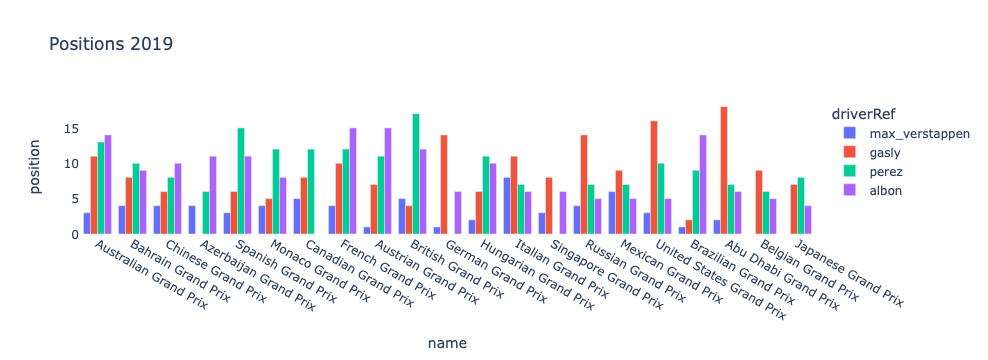

In [52]:
# Position 2019
df_results_2019 = df_results[(df_results['year']==2019)&((df_results['code']=='VER')|(df_results['code']=='GAS')|(df_results['code']=='ALB')|(df_results['code']=='PER'))]

fig = px.bar(df_results_2019, x='name', y='position'
             #,hover_data=['driverRef', 'position']
             , color='driverRef', height=100,barmode='group', title  = 'Positions 2019')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})

fig.show()

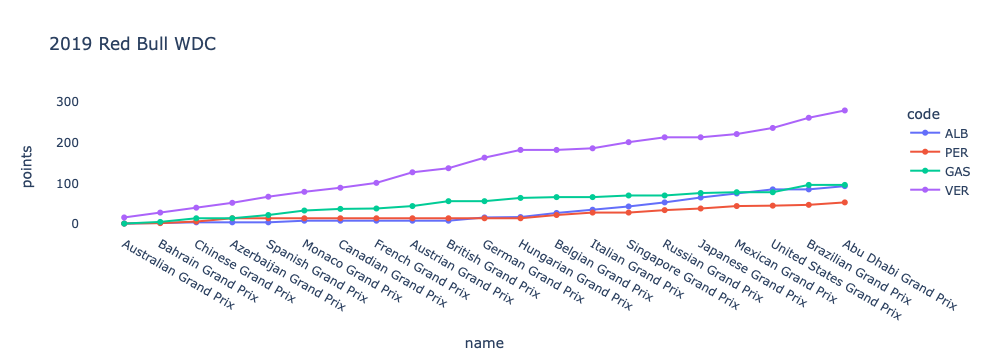

In [61]:
season_Points_2019_ = season_Points_2019.query("code in ['GAS', 'VER','ALB','PER']")
season_Points_2019_ = season_Points_2019.sort_values(by="date")
fig = px.line(season_Points_2019_, x='name', y='points', color='code', markers=True, title = '2019 Red Bull WDC')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

# 2020
##### Verstappen - Main driver
##### Albon - Teammate
##### Gasly - Alpha Tauri
##### Checo Pérez- Racing Point


In [54]:
# 2020 Season Gran Prixs info

df_laps_2020 = df[(df['year']==2020)&((df['code']=='VER')|(df['code']=='GAS'))|(df['driverRef']=='albon')|(df['driverRef']=='perez')].copy()
df_laps_2020.rename(columns={'position':'lap position'},inplace=True)
df_laps_2020 = df_laps_2020.merge(results[['raceId','driverId','position']],how='left',on=['raceId','driverId'])
df_laps_2020 = df_laps_2020.merge(pit_stops[['raceId','driverId','lap','stop']],how='left',on=['raceId','driverId','lap'])
df_laps_2020['stop'].fillna(0,inplace=True)
df_laps_2020['stop']=df_laps_2020['stop'].astype(int)
df_laps_2020['stop'][df_laps_2020['stop']==0] = ''
df_laps_2020

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_6841/1101604470.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,raceId,driverId,lap,lap position,time,milliseconds,code,driverRef,name,date,year,position,stop
0,841,815,1,14,1:52.663,112663,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
1,841,815,2,14,1:37.576,97576,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
2,841,815,3,14,1:36.216,96216,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
3,841,815,4,14,1:35.617,95617,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
4,841,815,5,14,1:35.999,95999,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17098,1086,848,65,18,1:26.377,86377,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,
17099,1086,848,66,17,1:34.127,94127,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,
17100,1086,848,67,17,1:49.545,109545,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,
17101,1086,848,68,16,1:28.621,88621,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,


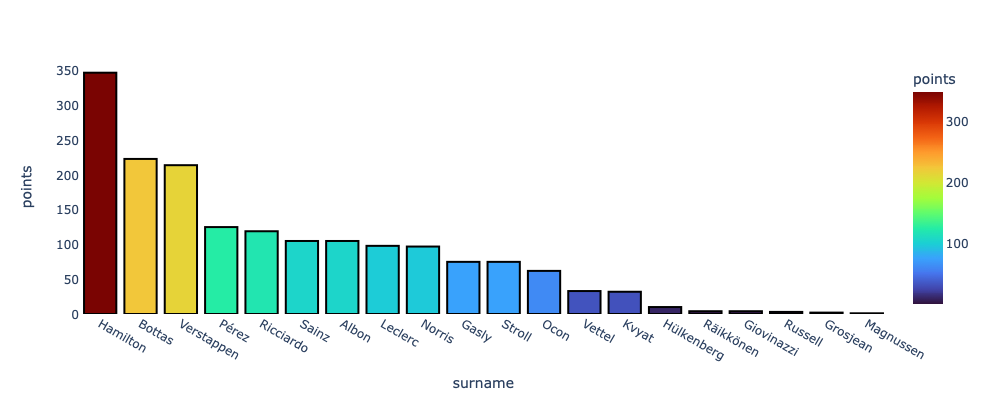

In [60]:
# 2020 Season Drivers Standings

h = driver_position.merge(circuits,left_on='circuitId',right_on='circuitId',how = 'left')
h.rename(columns={'name_y':'circuit_name'},inplace=True)
viz = h.loc[:,['date','year','circuit_name','surname','points','wins']]

viz.dropna(inplace = True)

viz.points = viz.points.astype('int64')
viz.wins = viz.wins.astype('int64')
viz.date = pd.to_datetime(viz.date)
    
top = viz[viz.loc[:,'year'] == 2020]
top = top.groupby(['surname'])[['points','wins']].max().sort_values('points',ascending = False).head(20).reset_index()

fig = px.bar(top, x='surname', y='points',hover_data=['wins'], color='points',height=400,color_continuous_scale= 'turbo')
fig.update_traces(textfont_size=20,marker=dict(line=dict(color='#000000', width=2)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)','paper_bgcolor': 'rgba(0, 0, 0, 0)',})

fig.show()

In [56]:
# 2020 Season 
df_2020 = df_laps_2020[df_laps_2020['year'] == 2020]
df_2020


,raceId,driverId,lap,lap position,time,milliseconds,code,driverRef,name,date,year,position,stop
11009,1031,830,1,2,1:13.501,73501,VER,max_verstappen,Austrian Grand Prix,2020-07-05,2020,\N,
11010,1031,830,2,2,1:09.859,69859,VER,max_verstappen,Austrian Grand Prix,2020-07-05,2020,\N,
11011,1031,830,3,2,1:09.380,69380,VER,max_verstappen,Austrian Grand Prix,2020-07-05,2020,\N,
11012,1031,830,4,2,1:09.428,69428,VER,max_verstappen,Austrian Grand Prix,2020-07-05,2020,\N,
11013,1031,830,5,2,1:09.351,69351,VER,max_verstappen,Austrian Grand Prix,2020-07-05,2020,\N,
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14536,1047,815,4,17,1:44.762,104762,PER,perez,Abu Dhabi Grand Prix,2020-12-13,2020,\N,
14537,1047,815,5,16,1:43.786,103786,PER,perez,Abu Dhabi Grand Prix,2020-12-13,2020,\N,
14538,1047,815,6,15,1:43.263,103263,PER,perez,Abu Dhabi Grand Prix,2020-12-13,2020,\N,
14539,1047,815,7,15,1:45.123,105123,PER,perez,Abu Dhabi Grand Prix,2020-12-13,2020,\N,


In [57]:
# 2020 Season - drivers selected 
df_2020['driverRef'].unique()

array(['max_verstappen', 'albon', 'perez', 'gasly'], dtype=object)

In [58]:
# 2020 Season - All Grand Prix
df_2020['name'].unique()

array(['Austrian Grand Prix', 'Styrian Grand Prix',
       'Hungarian Grand Prix', 'British Grand Prix',
       '70th Anniversary Grand Prix', 'Spanish Grand Prix',
       'Belgian Grand Prix', 'Italian Grand Prix', 'Tuscan Grand Prix',
       'Russian Grand Prix', 'Eifel Grand Prix', 'Portuguese Grand Prix',
       'Emilia Romagna Grand Prix', 'Turkish Grand Prix',
       'Bahrain Grand Prix', 'Sakhir Grand Prix', 'Abu Dhabi Grand Prix'],
      dtype=object)

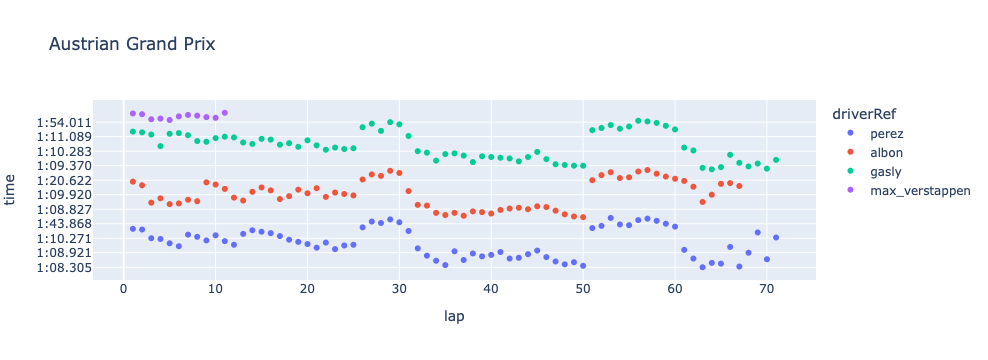

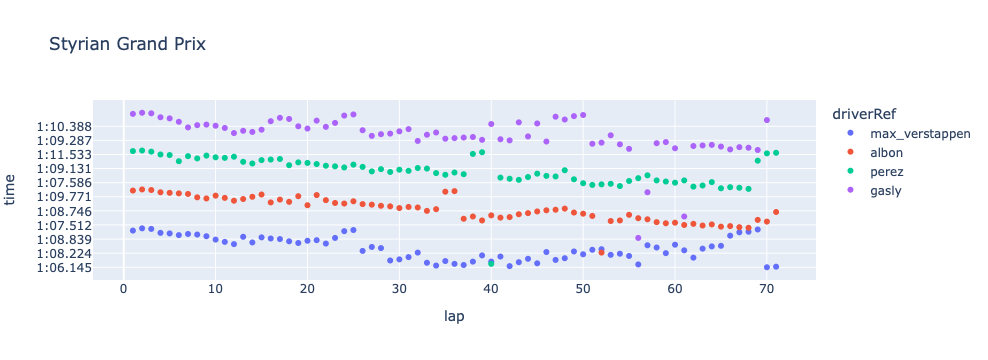

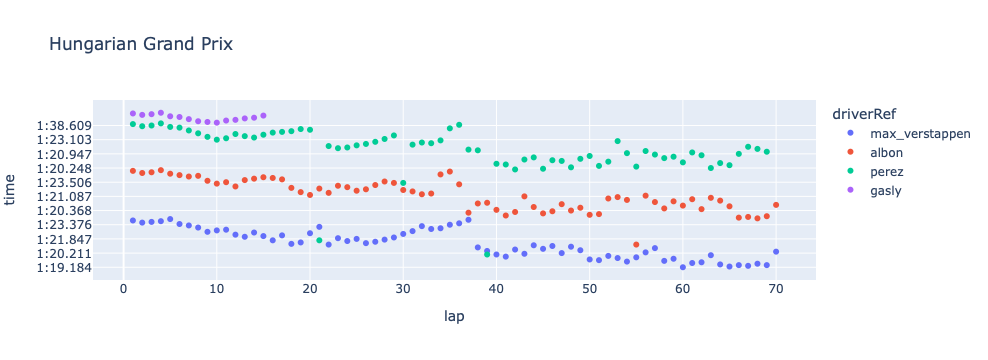

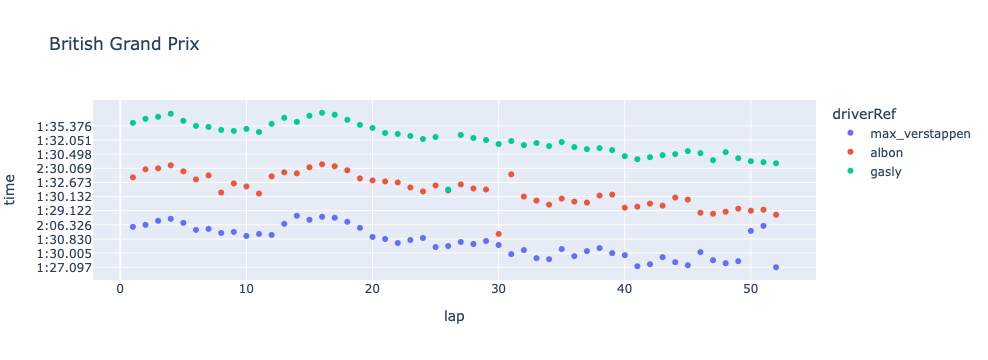

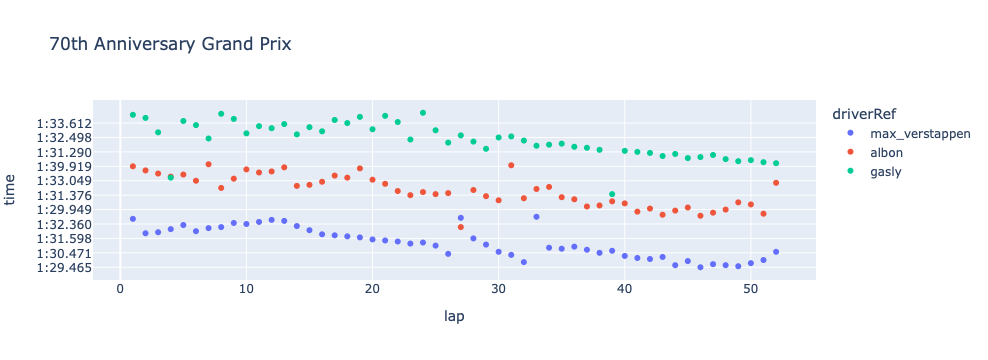

...

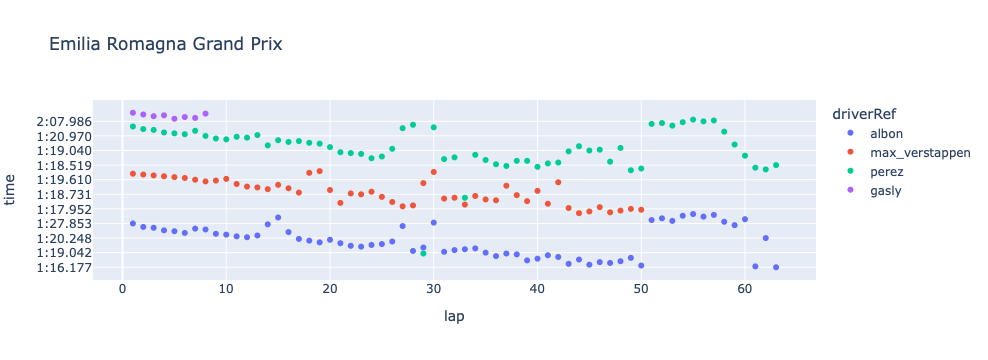

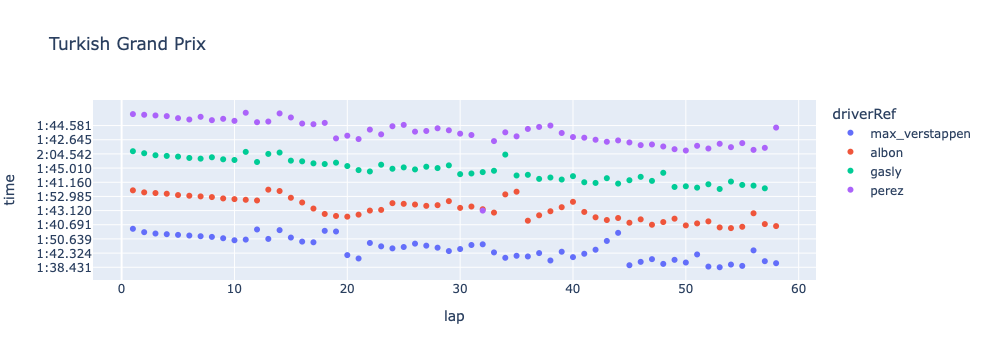

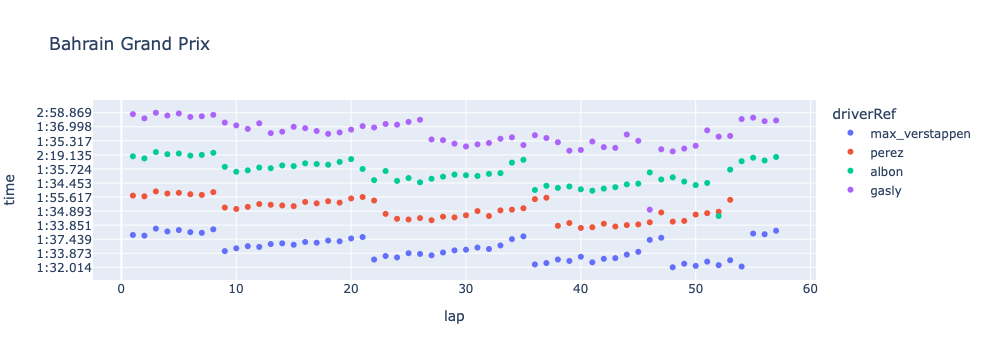

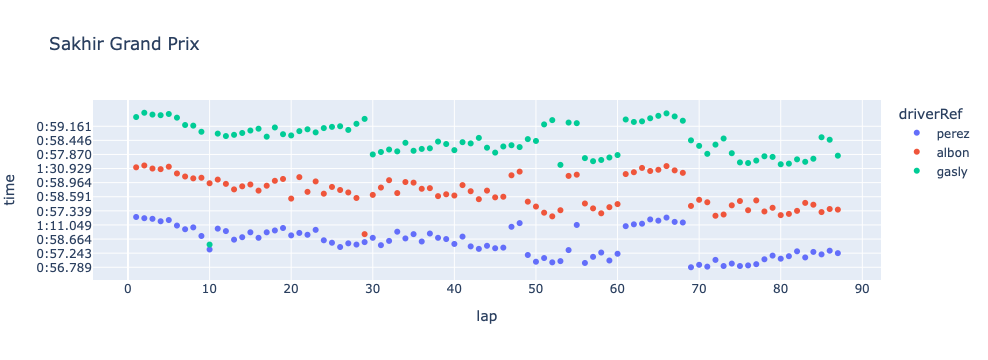

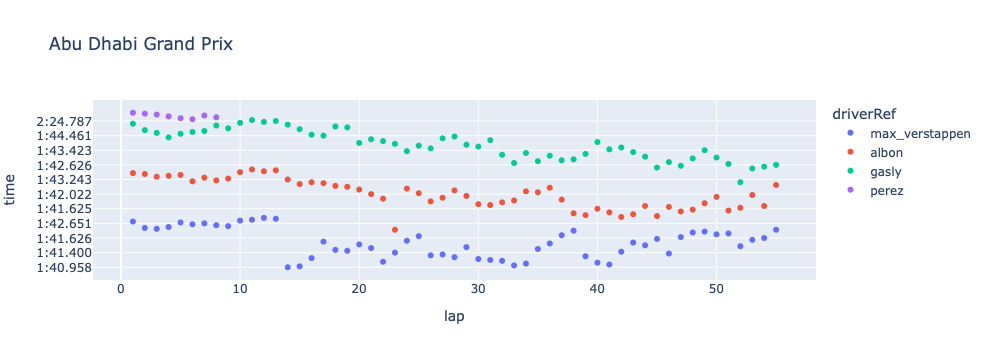

In [63]:

#'Austrian Grand Prix', 'Styrian Grand Prix',
       #'Hungarian Grand Prix', 'British Grand Prix',
       #'70th Anniversary Grand Prix', 'Spanish Grand Prix',
       #'Belgian Grand Prix', 'Italian Grand Prix', 'Tuscan Grand Prix',
       #'Russian Grand Prix', 'Eifel Grand Prix', 'Portuguese Grand Prix',
       #'Emilia Romagna Grand Prix', 'Turkish Grand Prix',
       #'Bahrain Grand Prix', 'Sakhir Grand Prix', 'Abu Dhabi Grand Prix'
        
        
# Austrian Grand Prix

df_2020_F_AUS = df_2020[(df_2020['name'] == 'Austrian Grand Prix')]
df_2020_AUS = df_2020_F_AUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_AUS = df_2020_AUS.sort_values(by="time")

fig_2020_1 = px.scatter(df_2020_AUS, x="lap", y="time", color = "driverRef", title = "Austrian Grand Prix")
fig_2020_1.update_traces(textposition="bottom right")
#fig_2020_1.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})
fig_2020_1.show()

# Styrian Grand Prix

df_2020_F_STY = df_2020[(df_2020['name'] == 'Styrian Grand Prix')]
df_2020_STY = df_2020_F_STY.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_STY = df_2020_STY.sort_values(by="time")

fig_2020_2 = px.scatter(df_2020_STY, x="lap", y="time", color = "driverRef", title = "Styrian Grand Prix")
fig_2020_2.update_traces(textposition="bottom right")

#fig_2020_2.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})
fig_2020_2.show()


# Hungarian Grand Prix

df_2020_F_HUN = df_2020[(df_2020['name'] == 'Hungarian Grand Prix')]
df_2020_HUN = df_2020_F_HUN.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_HUN = df_2020_HUN.sort_values(by="time")

fig_2020_3 = px.scatter(df_2020_HUN, x="lap", y="time", color = "driverRef", title = "Hungarian Grand Prix")
fig_2020_3.update_traces(textposition="bottom right")

# SEM background
#fig_2020_3.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})
fig_2020_3.show()

# British Grand Prix

df_2020_F_BRIT = df_2020[(df_2020['name'] == 'British Grand Prix')]
df_2020_BRIT = df_2020_F_BRIT.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_BRIT = df_2020_BRIT.sort_values(by="time")

fig_2020_4 = px.scatter(df_2020_BRIT, x="lap", y="time", color = "driverRef", title = "British Grand Prix")
fig_2020_4.update_traces(textposition="bottom right")
fig_2020_4.show()

# 70th Anniversary Grand Prix

df_2020_F_70TH = df_2020[(df_2020['name'] == '70th Anniversary Grand Prix')]
df_2020_70TH = df_2020_F_70TH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_70TH = df_2020_70TH.sort_values(by="time")

fig_2020_5 = px.scatter(df_2020_70TH, x="lap", y="time", color = "driverRef", title = "70th Anniversary Grand Prix")
fig_2020_5.update_traces(textposition="bottom right")
fig_2020_5.show()

# Spanish Grand Prix

df_2020_F_ESP = df_2020[(df_2020['name'] == 'Spanish Grand Prix')]
df_2020_ESP = df_2020_F_ESP.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_ESP = df_2020_ESP.sort_values(by="time")

fig_2020_6 = px.scatter(df_2020_ESP, x="lap", y="time", color = "driverRef", title = "Spanish Grand Prix")
fig_2020_6.update_traces(textposition="bottom right")
fig_2020_6.show()

# Belgian Grand Prix

df_2020_F_BEL = df_2020[(df_2020['name'] == 'Belgian Grand Prix')]
df_2020_BEL = df_2020_F_BEL.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_BEL = df_2020_BEL.sort_values(by="time")

fig_2020_7 = px.scatter(df_2020_BEL, x="lap", y="time", color = "driverRef", title = "Belgian Grand Prix")
fig_2020_7.update_traces(textposition="bottom right")
fig_2020_7.show()

# Italian Grand Prix

df_2020_F_ITA = df_2020[(df_2020['name'] == 'Italian Grand Prix')]
df_2020_ITA = df_2020_F_ITA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_ITA = df_2020_ITA.sort_values(by="time")

fig_2020_8 = px.scatter(df_2020_ITA, x="lap", y="time", color = "driverRef", title = "Italian Grand Prix")
fig_2020_8.update_traces(textposition="bottom right")
fig_2020_8.show()


# Tuscan Grand Prix

df_2020_F_TUS = df_2020[(df_2020['name'] == 'Tuscan Grand Prix')]
df_2020_TUS = df_2020_F_TUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_TUS = df_2020_TUS.sort_values(by="time")

fig_2020_9 = px.scatter(df_2020_TUS, x="lap", y="time", color = "driverRef", title = "Tuscan Grand Prix")
fig_2020_9.update_traces(textposition="bottom right")
fig_2020_9.show()



# Russian Grand Prix

df_2020_F_RUS = df_2020[(df_2020['name'] == 'Russian Grand Prix')]
df_2020_RUS = df_2020_F_RUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_RUS = df_2020_RUS.sort_values(by="time")

fig_2020_10 = px.scatter(df_2020_RUS, x="lap", y="time", color = "driverRef", title = "Russian Grand Prix")
fig_2020_10.update_traces(textposition="bottom right")
fig_2020_10.show()

# Eifel Grand Prix

df_2020_F_EIF = df_2020[(df_2020['name'] == 'Eifel Grand Prix')]
df_2020_EIF = df_2020_F_EIF.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_EIF = df_2020_EIF.sort_values(by="time")

fig_2020_11 = px.scatter(df_2020_EIF, x="lap", y="time", color = "driverRef", title = "Eifel Grand Prix")
fig_2020_11.update_traces(textposition="bottom right")
fig_2020_11.show()

# Portuguese Grand Prix

df_2020_F_POR = df_2020[(df_2020['name'] == 'Portuguese Grand Prix')]
df_2020_POR = df_2020_F_POR.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_POR = df_2020_POR.sort_values(by="time")

fig_2020_12 = px.scatter(df_2020_POR, x="lap", y="time", color = "driverRef", title = "Portuguese Grand Prix")
fig_2020_12.update_traces(textposition="bottom right")
fig_2020_12.show()

# Emilia Romagna Grand Prix

df_2020_F_EMI = df_2020[(df_2020['name'] == 'Emilia Romagna Grand Prix')]
df_2020_EMI = df_2020_F_EMI.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_EMI = df_2020_EMI.sort_values(by="time")

fig_2020_13 = px.scatter(df_2020_EMI, x="lap", y="time", color = "driverRef", title = "Emilia Romagna Grand Prix")
fig_2020_13.update_traces(textposition="bottom right")
fig_2020_13.show()

# Turkish Grand Prix

df_2020_F_TUR = df_2020[(df_2020['name'] == 'Turkish Grand Prix')]
df_2020_TUR = df_2020_F_TUR.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_TUR = df_2020_TUR.sort_values(by="time")

fig_2020_14 = px.scatter(df_2020_TUR, x="lap", y="time", color = "driverRef", title = "Turkish Grand Prix")
fig_2020_14.update_traces(textposition="bottom right")
fig_2020_14.show()

# Bahrain Grand Prix

df_2020_F_BAH = df_2020[(df_2020['name'] == 'Bahrain Grand Prix')]
df_2020_BAH = df_2020_F_BAH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_BAH = df_2020_BAH.sort_values(by="time")

fig_2020_15 = px.scatter(df_2020_BAH, x="lap", y="time", color = "driverRef", title = "Bahrain Grand Prix")
fig_2020_15.update_traces(textposition="bottom right")
fig_2020_15.show()

# Sakhir Grand Prix

df_2020_F_SAK = df_2020[(df_2020['name'] == 'Sakhir Grand Prix')]
df_2020_SAK = df_2020_F_SAK.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_SAK = df_2020_SAK.sort_values(by="time")

fig_2020_16 = px.scatter(df_2020_SAK, x="lap", y="time", color = "driverRef", title = "Sakhir Grand Prix")
fig_2020_16.update_traces(textposition="bottom right")
fig_2020_16.show()

# Abu Dhabi Grand Prix

df_2020_F_ABH = df_2020[(df_2020['name'] == 'Abu Dhabi Grand Prix')]
df_2020_ABH  = df_2020_F_ABH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_ABH  = df_2020_ABH.sort_values(by="time")

fig_2020_21 = px.scatter(df_2020_ABH, x="lap", y="time", color = "driverRef", title = "Abu Dhabi Grand Prix")
fig_2020_21.update_traces(textposition="bottom right")
fig_2020_21.show()



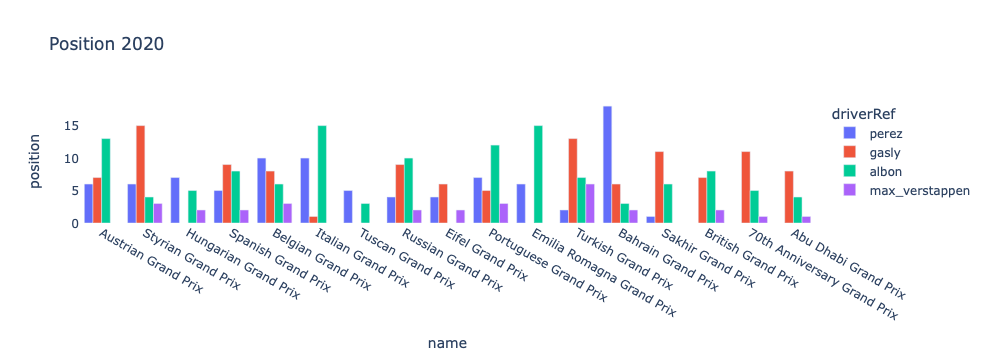

In [23]:
# Positions 2020
df_results_2020 = df_results[(df_results['year']==2020)&((df_results['code']=='VER')|(df_results['code']=='GAS')|(df_results['code']=='ALB')|(df_results['code']=='PER'))]

fig = px.bar(df_results_2020, x='name', y='position'
             #,hover_data=['driverRef', 'position']
             , color='driverRef', height=100,barmode='group', title = 'Position 2020')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})

fig.show()


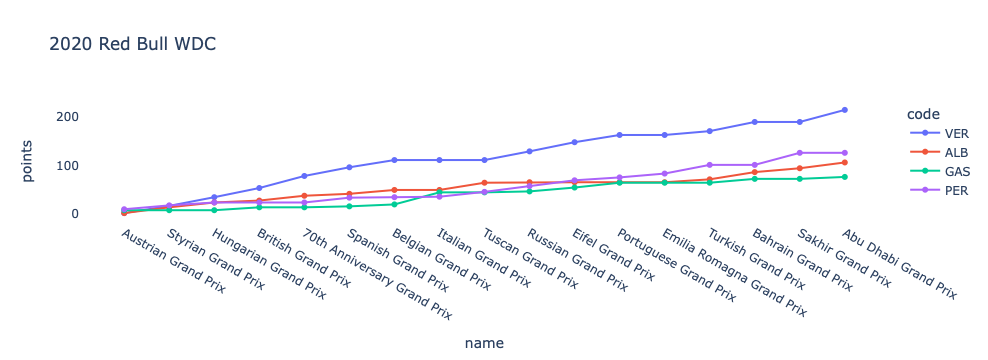

In [88]:
season_Points_2020_ = season_Points_2020.query("code in ['GAS', 'VER','ALB','PER']")
season_Points_2020_ = season_Points_2020.sort_values(by="date")
fig = px.line(season_Points_2020_, x='name', y='points', color='code', markers=True, title = '2020 Red Bull WDC')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

# 2021
##### Verstappen - Main driver
##### Checo Pérez - Teammate 
##### Gasly - Alpha Tauri
##### Albon - RB reserve driver


In [23]:
# 2021 Season races info

df_laps_2021 = df[(df['year']==2021)&((df['code']=='VER')|(df['code']=='GAS'))|(df['driverRef']=='albon')|(df['driverRef']=='perez')].copy()
df_laps_2021.rename(columns={'position':'lap position'},inplace=True)
df_laps_2021 = df_laps_2021.merge(results[['raceId','driverId','position']],how='left',on=['raceId','driverId'])
df_laps_2021 = df_laps_2021.merge(pit_stops[['raceId','driverId','lap','stop']],how='left',on=['raceId','driverId','lap'])
df_laps_2021['stop'].fillna(0,inplace=True)
df_laps_2021['stop']=df_laps_2021['stop'].astype(int)
df_laps_2021['stop'][df_laps_2021['stop']==0] = ''
df_laps_2021

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_4030/3170933717.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,raceId,driverId,lap,lap position,time,milliseconds,code,driverRef,name,date,year,position,stop
0,841,815,1,14,1:52.663,112663,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
1,841,815,2,14,1:37.576,97576,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
2,841,815,3,14,1:36.216,96216,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
3,841,815,4,14,1:35.617,95617,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
4,841,815,5,14,1:35.999,95999,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17776,1086,848,65,18,1:26.377,86377,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,
17777,1086,848,66,17,1:34.127,94127,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,
17778,1086,848,67,17,1:49.545,109545,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,
17779,1086,848,68,16,1:28.621,88621,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,


In [24]:
# 2021 Season
df_2021 = df_laps_2021[df_laps_2021['year'] == 2021]
df_2021

,raceId,driverId,lap,lap position,time,milliseconds,code,driverRef,name,date,year,position,stop
12882,1052,830,1,1,1:58.245,118245,VER,max_verstappen,Bahrain Grand Prix,2021-03-28,2021,2,
12883,1052,830,2,1,2:22.406,142406,VER,max_verstappen,Bahrain Grand Prix,2021-03-28,2021,2,
12884,1052,830,3,1,2:38.001,158001,VER,max_verstappen,Bahrain Grand Prix,2021-03-28,2021,2,
12885,1052,830,4,1,1:44.343,104343,VER,max_verstappen,Bahrain Grand Prix,2021-03-28,2021,2,
12886,1052,830,5,1,1:44.629,104629,VER,max_verstappen,Bahrain Grand Prix,2021-03-28,2021,2,
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16400,1073,842,54,6,1:50.389,110389,GAS,gasly,Abu Dhabi Grand Prix,2021-12-12,2021,5,2
16401,1073,842,55,7,2:00.394,120394,GAS,gasly,Abu Dhabi Grand Prix,2021-12-12,2021,5,
16402,1073,842,56,6,2:02.485,122485,GAS,gasly,Abu Dhabi Grand Prix,2021-12-12,2021,5,
16403,1073,842,57,6,2:16.957,136957,GAS,gasly,Abu Dhabi Grand Prix,2021-12-12,2021,5,


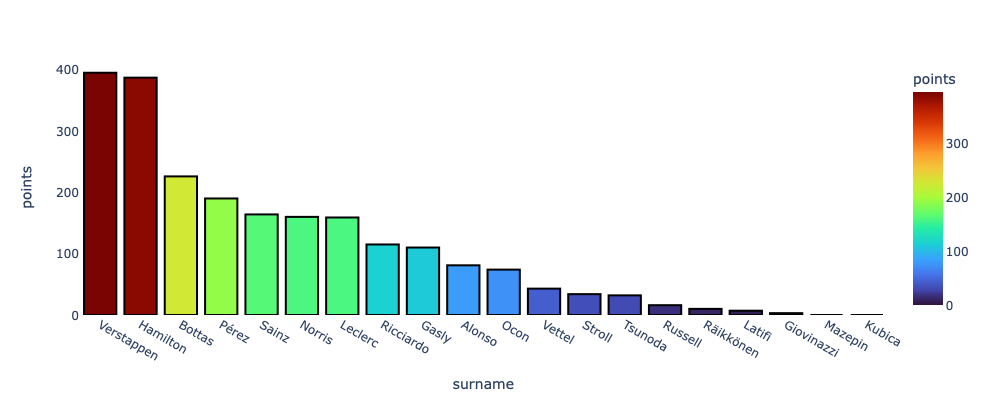

In [87]:
# 2021 Season - Driver Standings

h = driver_position.merge(circuits,left_on='circuitId',right_on='circuitId',how = 'left')
h.rename(columns={'name_y':'circuit_name'},inplace=True)
viz = h.loc[:,['date','year','circuit_name','surname','points','wins']]

viz.dropna(inplace = True)

viz.points = viz.points.astype('int64')
viz.wins = viz.wins.astype('int64')
viz.date = pd.to_datetime(viz.date)
    
top = viz[viz.loc[:,'year'] == 2021]
top = top.groupby(['surname'])[['points','wins']].max().sort_values('points',ascending = False).head(20).reset_index()

fig = px.bar(top, x='surname', y='points',hover_data=['wins'], color='points',height=400,color_continuous_scale= 'turbo')
fig.update_traces(textfont_size=20,marker=dict(line=dict(color='#000000', width=2)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})

fig.show()

In [26]:
# 2021 Season - drivers selected 
df_2021['driverRef'].unique()

array(['max_verstappen', 'gasly', 'perez'], dtype=object)

In [27]:
# 2020 Season - All Grand Prix
df_2021['name'].unique()

array(['Bahrain Grand Prix', 'Emilia Romagna Grand Prix',
       'Portuguese Grand Prix', 'Spanish Grand Prix', 'Monaco Grand Prix',
       'Azerbaijan Grand Prix', 'French Grand Prix', 'Styrian Grand Prix',
       'Austrian Grand Prix', 'British Grand Prix',
       'Hungarian Grand Prix', 'Belgian Grand Prix', 'Dutch Grand Prix',
       'Italian Grand Prix', 'Russian Grand Prix', 'Turkish Grand Prix',
       'United States Grand Prix', 'Mexico City Grand Prix',
       'São Paulo Grand Prix', 'Qatar Grand Prix',
       'Saudi Arabian Grand Prix', 'Abu Dhabi Grand Prix'], dtype=object)

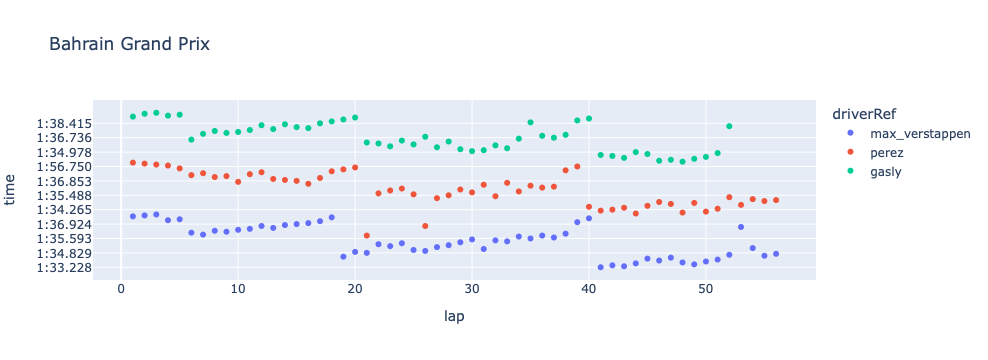

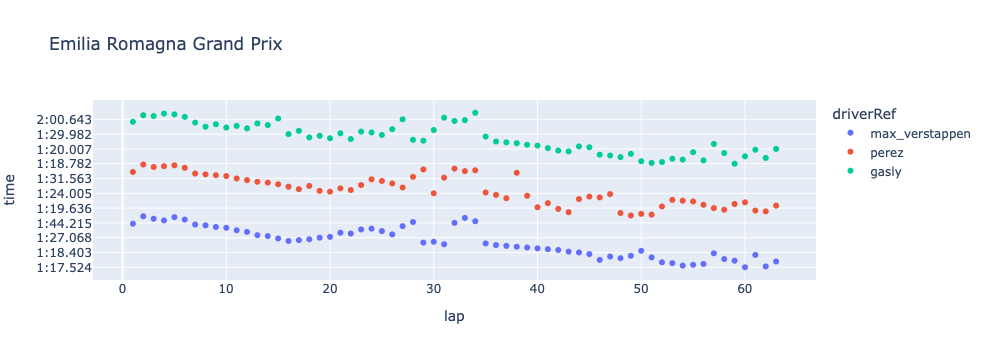

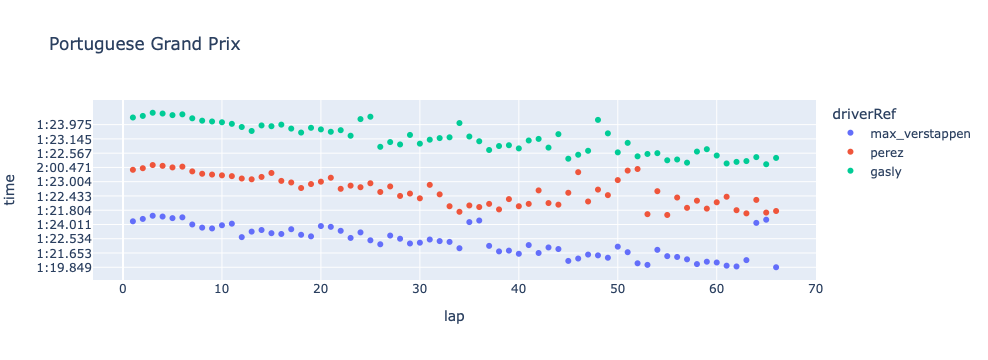

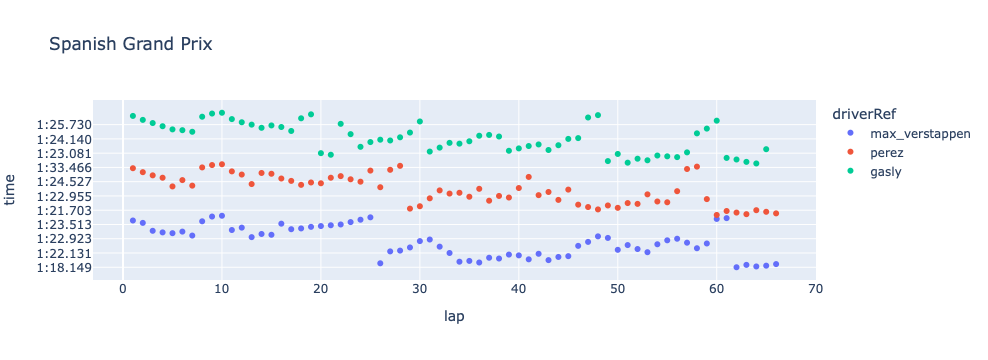

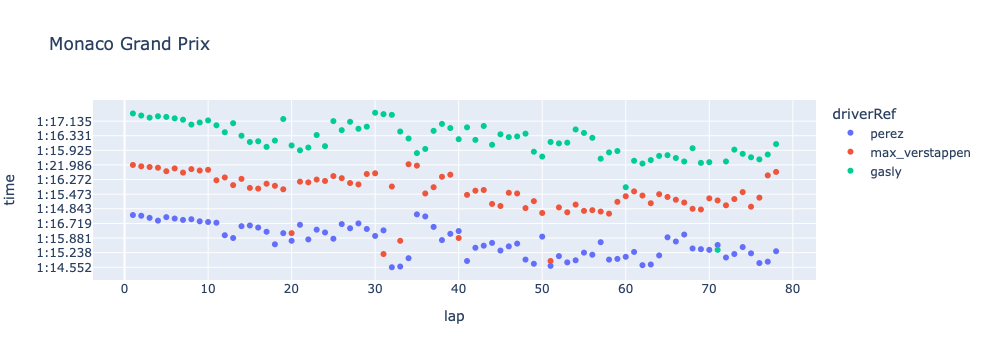

...

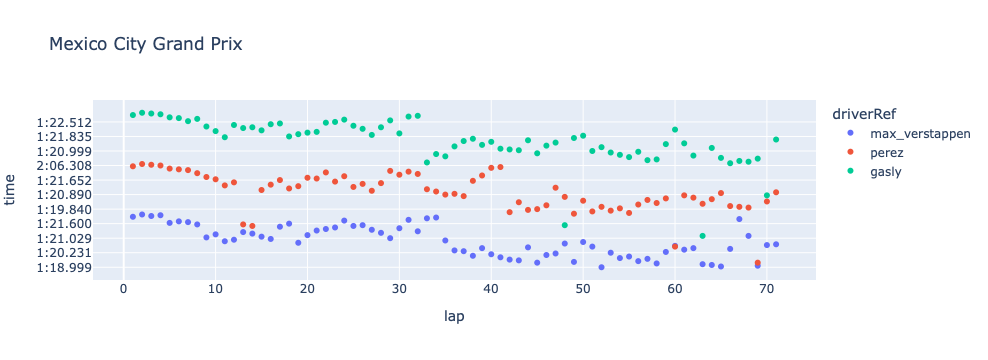

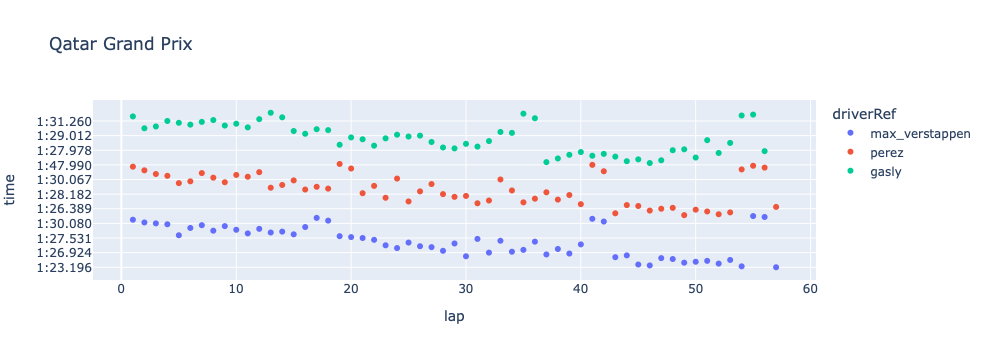

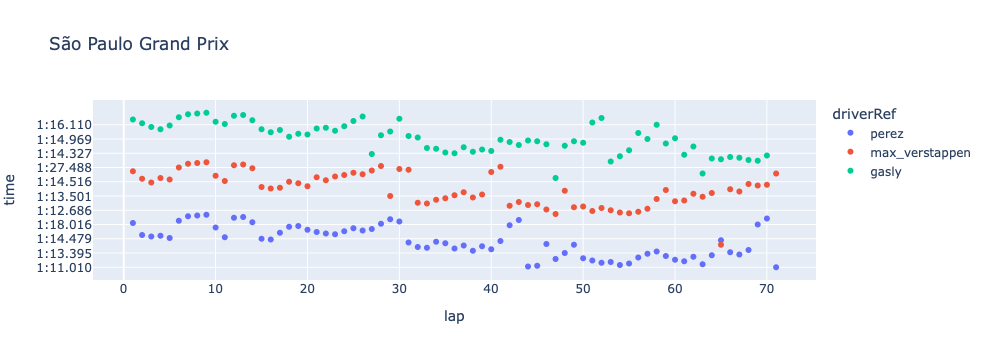

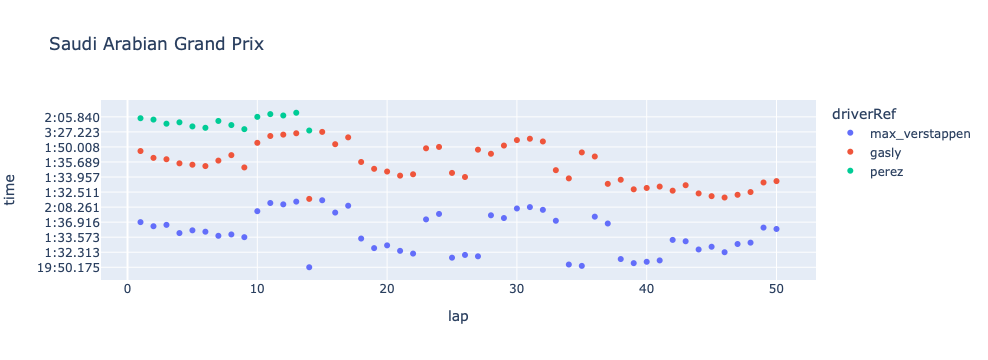

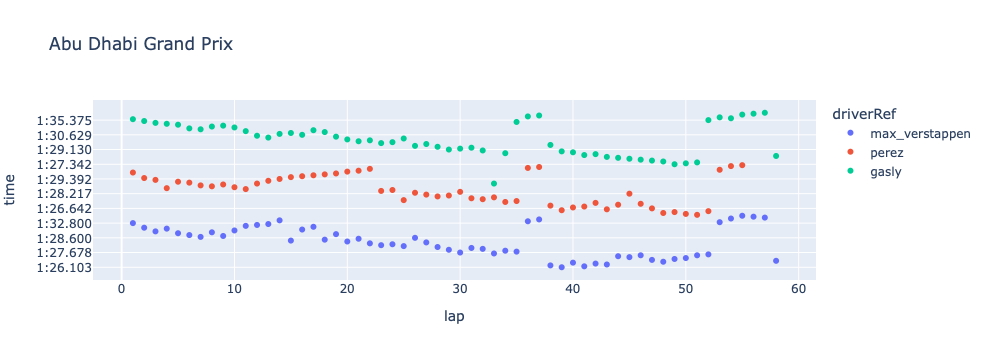

In [28]:
#'Bahrain Grand Prix', 'Emilia Romagna Grand Prix',
 #      'Portuguese Grand Prix', 'Spanish Grand Prix', 'Monaco Grand Prix',
  #     'Azerbaijan Grand Prix', 'French Grand Prix', 'Styrian Grand Prix',
   #    'Austrian Grand Prix', 'British Grand Prix',
    #   'Hungarian Grand Prix', 'Belgian Grand Prix', 'Dutch Grand Prix',
     #  'Italian Grand Prix', 'Russian Grand Prix', 'Turkish Grand Prix',
      # 'United States Grand Prix', 'Mexico City Grand Prix',
       #'São Paulo Grand Prix', 'Qatar Grand Prix',
       #'Saudi Arabian Grand Prix', 'Abu Dhabi Grand Prix'
    

# Bahrain Grand Prix (1)

df_2021_F_BAH = df_2021[(df_2021['name'] == 'Bahrain Grand Prix')]
df_2021_BAH = df_2021_F_BAH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_BAH = df_2021_BAH.sort_values(by="time")

fig_2021_1 = px.scatter(df_2021_BAH, x="lap", y="time", color = "driverRef", title = "Bahrain Grand Prix")
fig_2021_1.update_traces(textposition="bottom right")
fig_2021_1.show()

# Emilia Romagna Grand Prix (2)

df_2021_F_EMI = df_2021[(df_2021['name'] == 'Emilia Romagna Grand Prix')]
df_2021_EMI = df_2021_F_EMI.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_EMI = df_2021_EMI.sort_values(by="time")

fig_2021_2 = px.scatter(df_2021_EMI, x="lap", y="time", color = "driverRef", title = "Emilia Romagna Grand Prix")
fig_2021_2.update_traces(textposition="bottom right")
fig_2021_2.show()

# Portuguese Grand Prix (3)

df_2021_F_POR = df_2021[(df_2021['name'] == 'Portuguese Grand Prix')]
df_2021_POR = df_2021_F_POR.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_POR = df_2021_POR.sort_values(by="time")

fig_2021_3 = px.scatter(df_2021_POR, x="lap", y="time", color = "driverRef", title = "Portuguese Grand Prix")
fig_2021_3.update_traces(textposition="bottom right")
fig_2021_3.show()

# Spanish Grand Prix (4)

df_2021_F_ESP = df_2021[(df_2021['name'] == 'Spanish Grand Prix')]
df_2021_ESP = df_2021_F_ESP.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_ESP = df_2021_ESP.sort_values(by="time")

fig_2021_4 = px.scatter(df_2021_ESP, x="lap", y="time", color = "driverRef", title = "Spanish Grand Prix")
fig_2021_4.update_traces(textposition="bottom right")
fig_2021_4.show()

# Monaco Grand Prix (5)

df_2021_F_MON = df_2021[(df_2021['name'] == 'Monaco Grand Prix')]
df_2021_MON = df_2021_F_MON.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_MON = df_2021_MON.sort_values(by="time")

fig_2021_5 = px.scatter(df_2021_MON, x="lap", y="time", color = "driverRef", title = "Monaco Grand Prix")
fig_2021_5.update_traces(textposition="bottom right")
fig_2021_5.show()

# Azerbaijan Grand Prix (6)

df_2021_F_AZB = df_2021[(df_2021['name'] == 'Azerbaijan Grand Prix')]
df_2021_AZB = df_2021_F_AZB.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_AZB = df_2021_AZB.sort_values(by="time")

fig_2021_6 = px.scatter(df_2021_AZB, x="lap", y="time", color = "driverRef", title = "Azerbaijan Grand Prix")
fig_2021_6.update_traces(textposition="bottom right")
fig_2021_6.show()

# French Grand Prix (7)

df_2021_F_FRA = df_2021[(df_2021['name'] == 'French Grand Prix')]
df_2021_FRA = df_2021_F_FRA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_FRA = df_2021_FRA.sort_values(by="time")

fig_2021_7 = px.scatter(df_2021_FRA, x="lap", y="time", color = "driverRef", title = "French Grand Prix")
fig_2021_7.update_traces(textposition="bottom right")
fig_2021_7.show()



# Styrian Grand Prix (8)

df_2021_F_STY = df_2021[(df_2021['name'] == 'Styrian Grand Prix')]
df_2021_STY = df_2021_F_STY.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_STY = df_2021_STY.sort_values(by="time")

fig_2021_8 = px.scatter(df_2021_STY, x="lap", y="time", color = "driverRef", title = "Styrian Grand Prix")
fig_2021_8.update_traces(textposition="bottom right")
fig_2021_8.show()

# Austrian Grand Prix (9)

df_2021_F_AUS = df_2021[(df_2021['name'] == 'Austrian Grand Prix')]
df_2021_AUS = df_2021_F_AUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_AUS = df_2021_AUS.sort_values(by="time")

fig_2021_9 = px.scatter(df_2021_AUS, x="lap", y="time", color = "driverRef", title = "Austrian Grand Prix")
fig_2021_9.update_traces(textposition="bottom right")
fig_2021_9.show()

# British Grand Prix (10)

df_2021_F_BRIT = df_2021[(df_2021['name'] == 'British Grand Prix')]
df_2021_BRIT = df_2021_F_BRIT.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_BRIT = df_2021_BRIT.sort_values(by="time")

fig_2021_10 = px.scatter(df_2021_BRIT, x="lap", y="time", color = "driverRef", title = "British Grand Prix")
fig_2021_10.update_traces(textposition="bottom right")
fig_2021_10.show()


# Hungarian Grand Prix (11)

df_2021_F_HUN = df_2021[(df_2021['name'] == 'Hungarian Grand Prix')]
df_2021_HUN = df_2021_F_HUN.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_HUN = df_2021_HUN.sort_values(by="time")

fig_2021_11 = px.scatter(df_2021_HUN, x="lap", y="time", color = "driverRef", title = "Hungarian Grand Prix")
fig_2021_11.update_traces(textposition="bottom right")
fig_2021_11.show()


# Belgian Grand Prix (12)

df_2021_F_BEL = df_2021[(df_2021['name'] == 'Belgian Grand Prix')]
df_2021_BEL = df_2021_F_BEL.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_BEL = df_2021_BEL.sort_values(by="time")

fig_2021_12 = px.scatter(df_2021_BEL, x="lap", y="time", color = "driverRef", title = "Belgian Grand Prix")
fig_2021_12.update_traces(textposition="bottom right")
fig_2021_12.show()



# Dutch Grand Prix (13)

df_2021_F_NED = df_2021[(df_2021['name'] == 'Dutch Grand Prix')]
df_2021_NED = df_2021_F_NED.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_NED = df_2021_NED.sort_values(by="time")

fig_2021_13 = px.scatter(df_2021_NED, x="lap", y="time", color = "driverRef", title = "Dutch Grand Prix")
fig_2021_13.update_traces(textposition="bottom right")
fig_2021_13.show()


# Italian Grand Prix (14)

df_2021_F_ITA = df_2021[(df_2021['name'] == 'Italian Grand Prix')]
df_2021_ITA = df_2021_F_ITA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_ITA = df_2021_ITA.sort_values(by="time")

fig_2021_14 = px.scatter(df_2021_ITA, x="lap", y="time", color = "driverRef", title = "Italian Grand Prix")
fig_2021_14.update_traces(textposition="bottom right")
fig_2021_14.show()

# Russian Grand Prix (15)

df_2021_F_RUS = df_2021[(df_2021['name'] == 'Russian Grand Prix')]
df_2021_RUS = df_2021_F_RUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_RUS = df_2021_RUS.sort_values(by="time")

fig_2021_15 = px.scatter(df_2021_RUS, x="lap", y="time", color = "driverRef", title = "Russian Grand Prix")
fig_2021_15.update_traces(textposition="bottom right")
fig_2021_15.show()

# Turkish Grand Prix (16)

df_2021_F_TUR = df_2021[(df_2021['name'] == 'Turkish Grand Prix')]
df_2021_TUR = df_2021_F_TUR.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_TUR = df_2021_TUR.sort_values(by="time")

fig_2021_16 = px.scatter(df_2021_TUR, x="lap", y="time", color = "driverRef", title = "Turkish Grand Prix")
fig_2021_16.update_traces(textposition="bottom right")
fig_2021_16.show()

# United States Grand Prix (17)

df_2021_F_USA = df_2021[(df_2021['name'] == 'United States Grand Prix')]
df_2021_USA = df_2021_F_USA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_USA = df_2021_USA.sort_values(by="time")

fig_2021_17 = px.scatter(df_2021_USA, x="lap", y="time", color = "driverRef", title = "United States Grand Prix")
fig_2021_17.update_traces(textposition="bottom right")
fig_2021_17.show()

# Mexico City Grand Prix (18)
df_2021_F_MEX = df_2021[(df_2021['name'] == 'Mexico City Grand Prix')]
df_2021_MEX = df_2021_F_MEX.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_MEX = df_2021_MEX.sort_values(by="time")

fig_2021_18 = px.scatter(df_2021_MEX, x="lap", y="time", color = "driverRef", title = "Mexico City Grand Prix")
fig_2021_18.update_traces(textposition="bottom right")
fig_2021_18.show()

# Qatar Grand Prix (19)

df_2021_F_QAT = df_2021[(df_2021['name'] == 'Qatar Grand Prix')]
df_2021_QAT = df_2021_F_QAT.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_QAT = df_2021_QAT.sort_values(by="time")

fig_2021_19 = px.scatter(df_2021_QAT, x="lap", y="time", color = "driverRef", title = "Qatar Grand Prix")
fig_2021_19.update_traces(textposition="bottom right")
fig_2021_19.show()


# São Paulo Grand Prix (20)

df_2021_F_BRZ = df_2021[(df_2021['name'] == 'São Paulo Grand Prix')]
df_2021_BRZ = df_2021_F_BRZ.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_BRZ = df_2021_BRZ.sort_values(by="time")

fig_2021_20 = px.scatter(df_2021_BRZ, x="lap", y="time", color = "driverRef", title = "São Paulo Grand Prix")
fig_2021_20.update_traces(textposition="bottom right")
fig_2021_20.show()


# Saudi Arabian Grand Prix (21)

df_2021_F_SAU = df_2021[(df_2021['name'] == 'Saudi Arabian Grand Prix')]
df_2021_SAU = df_2021_F_SAU.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_SAU = df_2021_SAU.sort_values(by="time")

fig_2021_21 = px.scatter(df_2021_SAU, x="lap", y="time", color = "driverRef", title = "Saudi Arabian Grand Prix")
fig_2021_21.update_traces(textposition="bottom right")
fig_2021_21.show()

# Abu Dhabi Grand Prix (22)

df_2021_F_ABH = df_2021[(df_2021['name'] == 'Abu Dhabi Grand Prix')]
df_2021_ABH  = df_2021_F_ABH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_ABH  = df_2021_ABH.sort_values(by="time")

fig_2021_22 = px.scatter(df_2021_ABH, x="lap", y="time", color = "driverRef", title = "Abu Dhabi Grand Prix")
fig_2021_22.update_traces(textposition="bottom right")
fig_2021_22.show()



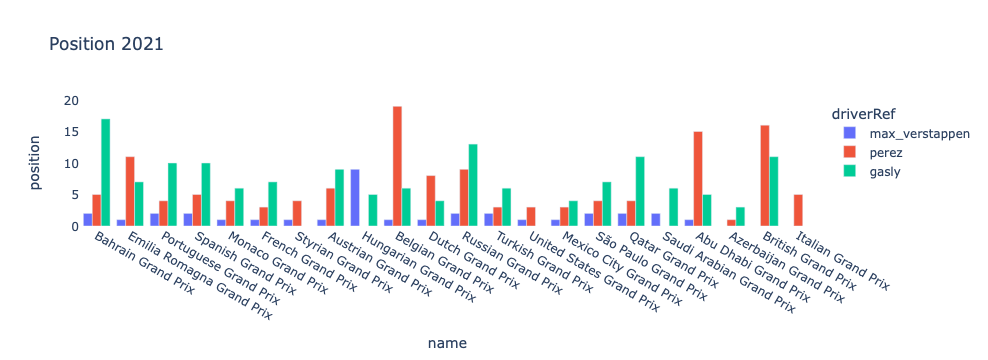

In [24]:
# Positions 2021
df_results_2021 = df_results[(df_results['year']==2021)&((df_results['code']=='VER')|(df_results['code']=='GAS')|(df_results['code']=='ALB')|(df_results['code']=='PER'))]

fig = px.bar(df_results_2021, x='name', y='position'
             #,hover_data=['driverRef', 'position']
             , color='driverRef', height=100,barmode='group', title = 'Position 2021')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()


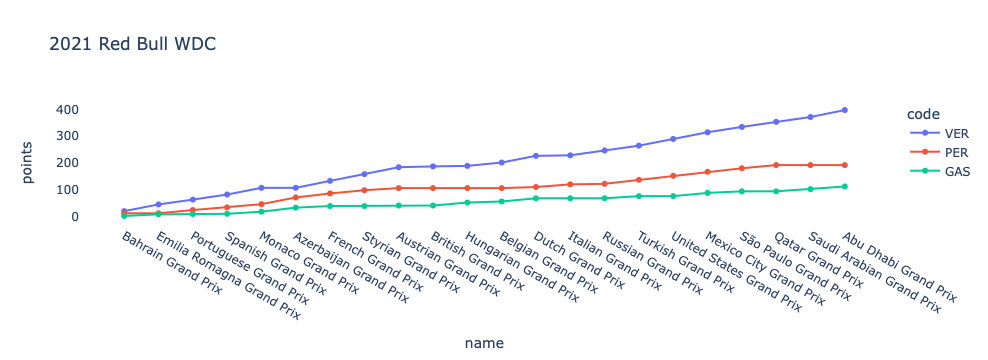

In [89]:
season_Points_2021_ = season_Points_2021.query("code in ['GAS', 'VER','ALB','PER']")
season_Points_2021_ = season_Points_2021.sort_values(by="date")
fig = px.line(season_Points_2021_, x='name', y='points', color='code', markers=True, title = '2021 Red Bull WDC')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

# 2022
##### Verstappen - Main driver
##### Checo Pérez - Teammate
##### Gasly - Alpha Tauri 
##### Albon - Williams



In [76]:
# 2022 Season races info

df_laps_2022 = df[(df['year']==2022)&((df['code']=='VER')|(df['code']=='GAS'))|(df['driverRef']=='albon')|(df['driverRef']=='perez')].copy()
df_laps_2022.rename(columns={'position':'lap position'},inplace=True)
df_laps_2022 = df_laps_2022.merge(results[['raceId','driverId','position']],how='left',on=['raceId','driverId'])
df_laps_2022 = df_laps_2022.merge(pit_stops[['raceId','driverId','lap','stop']],how='left',on=['raceId','driverId','lap'])
df_laps_2022['stop'].fillna(0,inplace=True)
df_laps_2022['stop']=df_laps_2022['stop'].astype(int)
df_laps_2022['stop'][df_laps_2022['stop']==0] = ''
df_laps_2022

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_6841/1536830261.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,raceId,driverId,lap,lap position,time,milliseconds,code,driverRef,name,date,year,position,stop
0,841,815,1,14,1:52.663,112663,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
1,841,815,2,14,1:37.576,97576,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
2,841,815,3,14,1:36.216,96216,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
3,841,815,4,14,1:35.617,95617,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
4,841,815,5,14,1:35.999,95999,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16925,1086,842,65,13,1:25.989,85989,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,
16926,1086,842,66,12,1:25.187,85187,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,
16927,1086,842,67,12,1:47.355,107355,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,
16928,1086,842,68,12,1:37.587,97587,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,


In [77]:
# 2022 Season
df_2022 = df_laps_2022[df_laps_2022['year'] == 2022]
df_2022

,raceId,driverId,lap,lap position,time,milliseconds,code,driverRef,name,date,year,position,stop
14068,1074,830,1,2,1:40.236,100236,VER,max_verstappen,Bahrain Grand Prix,2022-03-20,2022,19,
14069,1074,830,2,2,1:37.880,97880,VER,max_verstappen,Bahrain Grand Prix,2022-03-20,2022,19,
14070,1074,830,3,2,1:38.357,98357,VER,max_verstappen,Bahrain Grand Prix,2022-03-20,2022,19,
14071,1074,830,4,2,1:38.566,98566,VER,max_verstappen,Bahrain Grand Prix,2022-03-20,2022,19,
14072,1074,830,5,2,1:38.877,98877,VER,max_verstappen,Bahrain Grand Prix,2022-03-20,2022,19,
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16925,1086,842,65,13,1:25.989,85989,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,
16926,1086,842,66,12,1:25.187,85187,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,
16927,1086,842,67,12,1:47.355,107355,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,
16928,1086,842,68,12,1:37.587,97587,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,


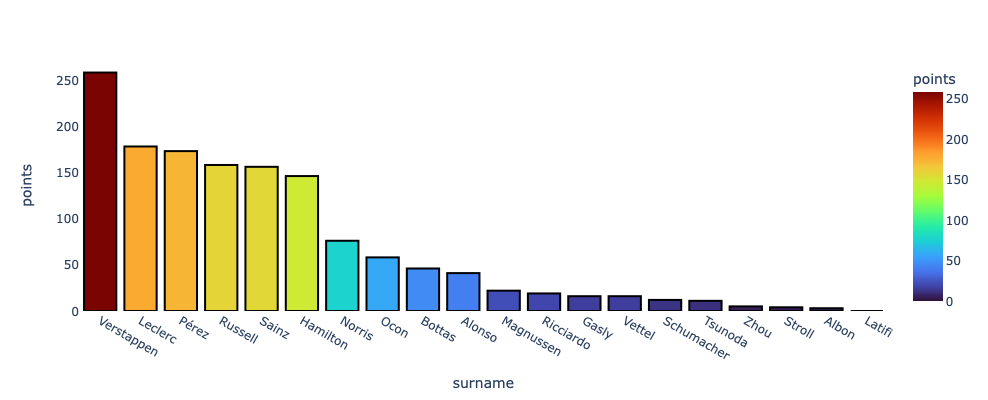

In [78]:
# 2022 Drivers Standings 

h = driver_position.merge(circuits,left_on='circuitId',right_on='circuitId',how = 'left')
h.rename(columns={'name_y':'circuit_name'},inplace=True)
viz = h.loc[:,['date','year','circuit_name','surname','points','wins']]

viz.dropna(inplace = True)

viz.points = viz.points.astype('int64')
viz.wins = viz.wins.astype('int64')
viz.date = pd.to_datetime(viz.date)
    
top = viz[viz.loc[:,'year'] == 2022]
top = top.groupby(['surname'])[['points','wins']].max().sort_values('points',ascending = False).head(20).reset_index()

fig = px.bar(top, x='surname', y='points',hover_data=['wins'], color='points',height=400,color_continuous_scale= 'turbo')
fig.update_traces(textfont_size=20,marker=dict(line=dict(color='#000000', width=2)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})

fig.show()

In [79]:
# 2022 Season - drivers selected 
df_2022['driverRef'].unique()

array(['max_verstappen', 'perez', 'gasly', 'albon'], dtype=object)

In [80]:
# 2022 Season - All Grand Prix 
df_2022['name'].unique()

array(['Bahrain Grand Prix', 'Saudi Arabian Grand Prix',
       'Australian Grand Prix', 'Emilia Romagna Grand Prix',
       'Miami Grand Prix', 'Spanish Grand Prix', 'Monaco Grand Prix',
       'Azerbaijan Grand Prix', 'Canadian Grand Prix',
       'British Grand Prix', 'Austrian Grand Prix', 'French Grand Prix',
       'Hungarian Grand Prix'], dtype=object)

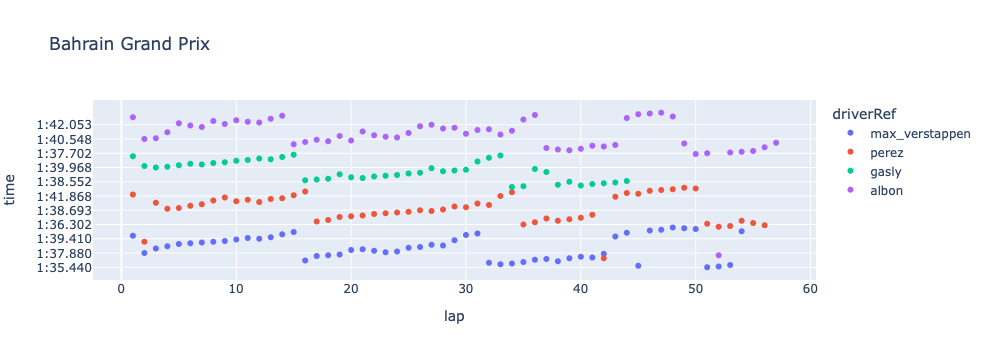

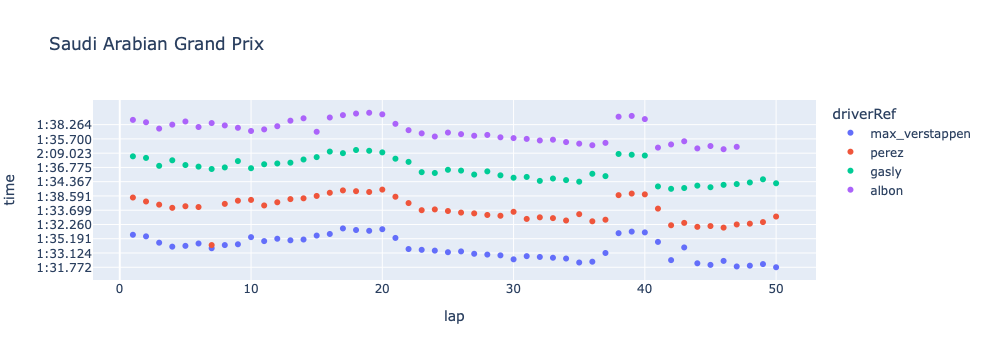

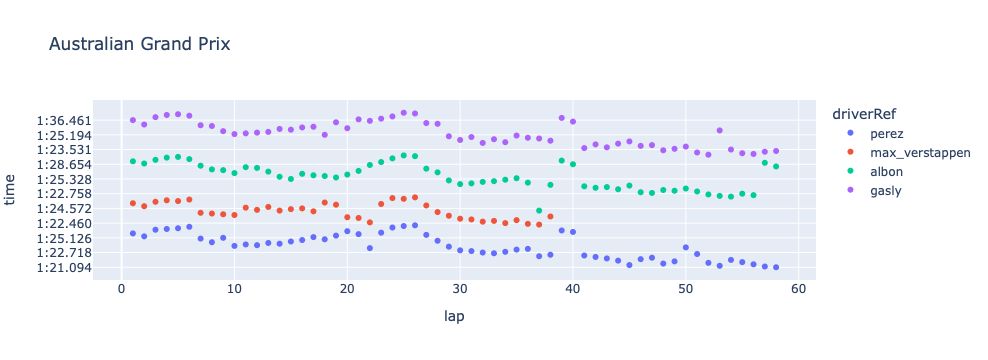

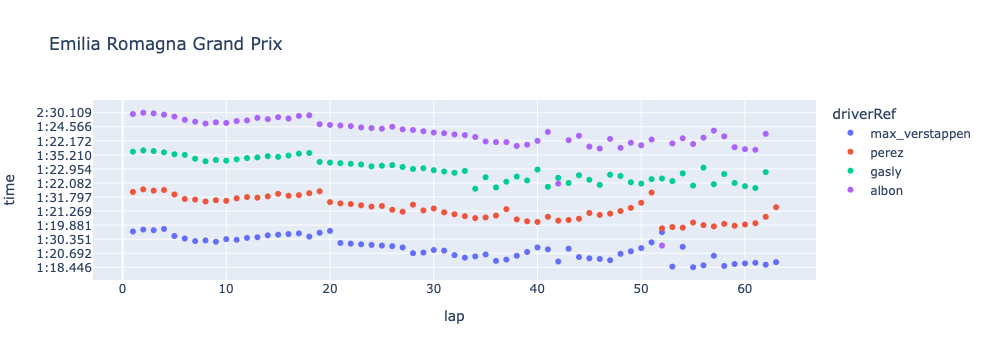

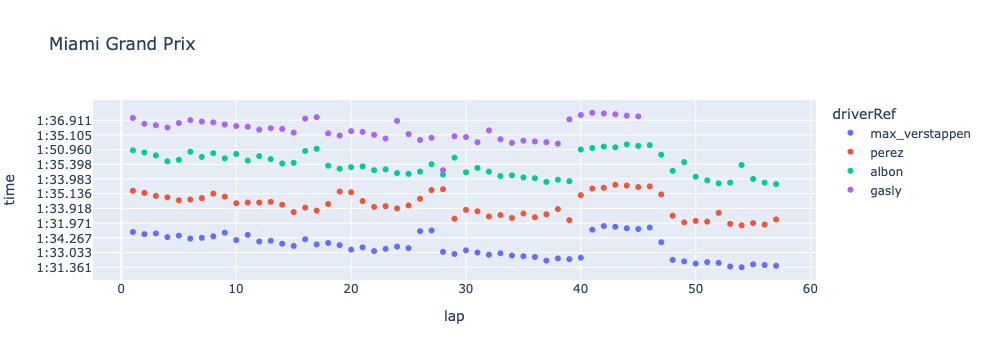

...

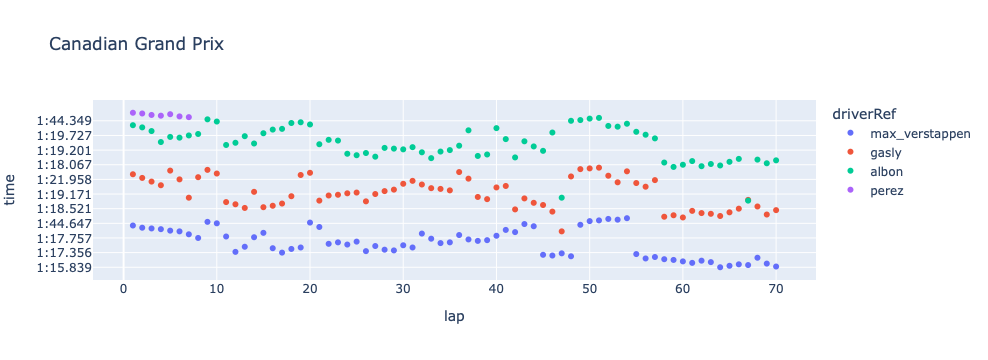

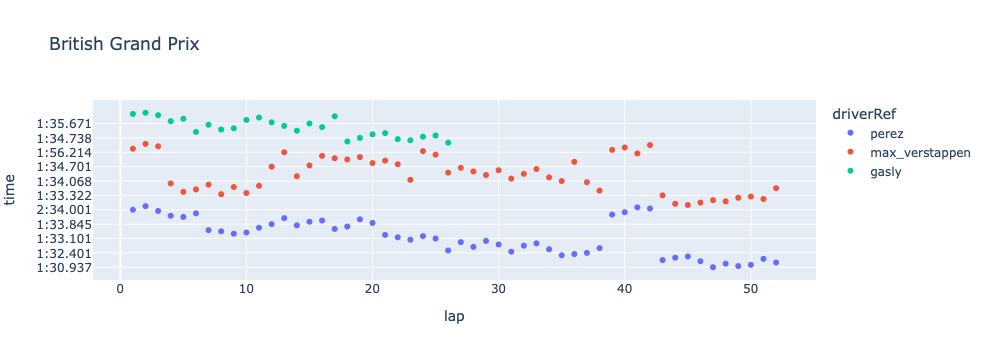

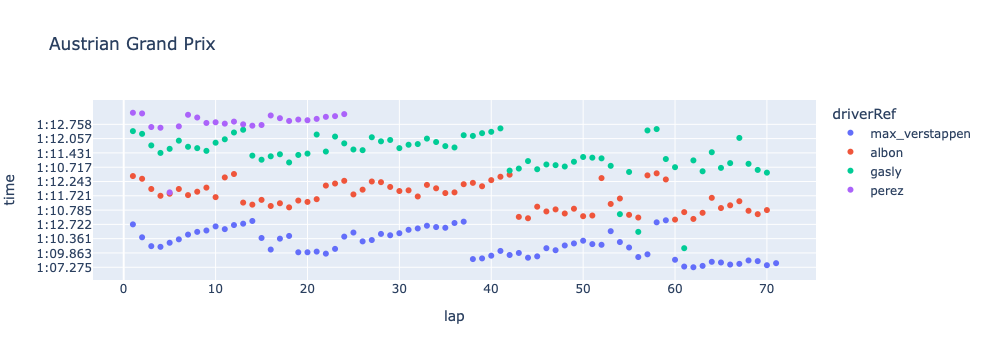

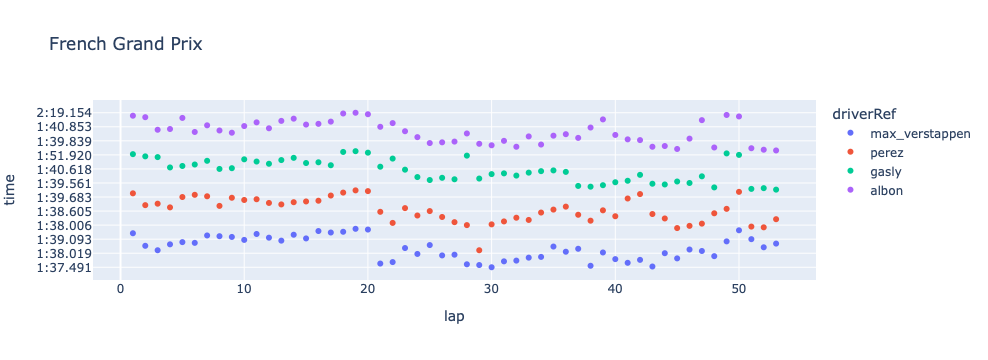

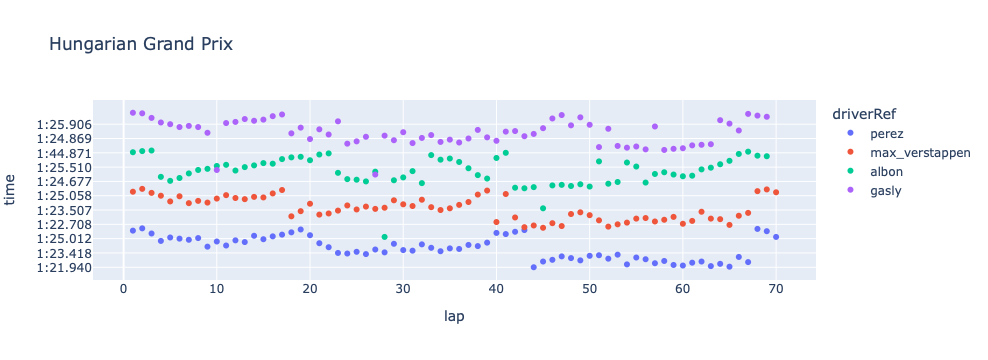

In [81]:
#'Bahrain Grand Prix', 'Saudi Arabian Grand Prix',
 #      'Australian Grand Prix', 'Emilia Romagna Grand Prix',
  #     'Miami Grand Prix', 'Spanish Grand Prix', 'Monaco Grand Prix',
   #    'Azerbaijan Grand Prix', 'Canadian Grand Prix',
    #   'British Grand Prix', 'Austrian Grand Prix', 'French Grand Prix',
     #  'Hungarian Grand Prix'
        
# Bahrain Grand Prix (1)

df_2022_F_BAH = df_2022[(df_2022['name'] == 'Bahrain Grand Prix')]
df_2022_BAH = df_2022_F_BAH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_BAH = df_2022_BAH.sort_values(by="time")

fig_2022_1 = px.scatter(df_2022_BAH, x="lap", y="time", color = "driverRef", title = "Bahrain Grand Prix")
fig_2022_1.update_traces(textposition="bottom right")
fig_2022_1.show()





# Saudi Arabian Grand Prix (2)

df_2022_F_SAU = df_2022[(df_2022['name'] == 'Saudi Arabian Grand Prix')]
df_2022_SAU = df_2022_F_SAU.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_SAU = df_2022_SAU.sort_values(by="time")

fig_2022_2 = px.scatter(df_2022_SAU, x="lap", y="time", color = "driverRef", title = "Saudi Arabian Grand Prix")
fig_2022_2.update_traces(textposition="bottom right")
fig_2022_2.show()

# Australian Grand Prix (3)

df_2022_F_AUST = df_2022[(df_2022['name'] == 'Australian Grand Prix')]
df_2022_AUST = df_2022_F_AUST.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_AUST = df_2022_AUST.sort_values(by="time")

fig_2022_3 = px.scatter(df_2022_AUST, x="lap", y="time", color = "driverRef", title = "Australian Grand Prix")
fig_2022_3.update_traces(textposition="bottom right")
fig_2022_3.show()




# Emilia Romagna Grand Prix (4)

df_2022_F_EMI = df_2022[(df_2022['name'] == 'Emilia Romagna Grand Prix')]
df_2022_EMI = df_2022_F_EMI.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_EMI = df_2022_EMI.sort_values(by="time")

fig_2022_4 = px.scatter(df_2022_EMI, x="lap", y="time", color = "driverRef", title = "Emilia Romagna Grand Prix")
fig_2022_4.update_traces(textposition="bottom right")
fig_2022_4.show()

# Miami Grand Prix (5)

df_2022_F_MIA = df_2022[(df_2022['name'] == 'Miami Grand Prix')]
df_2022_MIA = df_2022_F_MIA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_MIA = df_2022_MIA.sort_values(by="time")

fig_2022_5 = px.scatter(df_2022_MIA, x="lap", y="time", color = "driverRef", title = "Miami Grand Prix")
fig_2022_5.update_traces(textposition="bottom right")
fig_2022_5.show()

# Spanish Grand Prix (6)

df_2022_F_ESP = df_2022[(df_2022['name'] == 'Spanish Grand Prix')]
df_2022_ESP = df_2022_F_ESP.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_ESP = df_2022_ESP.sort_values(by="time")

fig_2022_6 = px.scatter(df_2022_ESP, x="lap", y="time", color = "driverRef", title = "Spanish Grand Prix")
fig_2022_6.update_traces(textposition="bottom right")
fig_2022_6.show()

# Monaco Grand Prix (7)

df_2022_F_MON = df_2022[(df_2022['name'] == 'Monaco Grand Prix')]
df_2022_MON = df_2022_F_MON.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_MON = df_2022_MON.sort_values(by="time")

fig_2022_7 = px.scatter(df_2022_MON, x="lap", y="time", color = "driverRef", title = "Monaco Grand Prix")
fig_2022_7.update_traces(textposition="bottom right")
fig_2022_7.show()

# Azerbaijan Grand Prix (8)

df_2022_F_AZB = df_2022[(df_2022['name'] == 'Azerbaijan Grand Prix')]
df_2022_AZB = df_2022_F_AZB.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_AZB = df_2022_AZB.sort_values(by="time")

fig_2022_8 = px.scatter(df_2022_AZB, x="lap", y="time", color = "driverRef", title = "Azerbaijan Grand Prix")
fig_2022_8.update_traces(textposition="bottom right")
fig_2022_8.show()

# Canadian Grand Prix (9)

df_2022_F_CAN = df_2022[(df_2022['name'] == 'Canadian Grand Prix')]
df_2022_CAN = df_2022_F_CAN.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_CAN = df_2022_CAN.sort_values(by="time")

fig_2022_9 = px.scatter(df_2022_CAN, x="lap", y="time", color = "driverRef", title = "Canadian Grand Prix")
fig_2022_9.update_traces(textposition="bottom right")
fig_2022_9.show()

# British Grand Prix (10)

df_2022_F_BRIT = df_2022[(df_2022['name'] == 'British Grand Prix')]
df_2022_BRIT = df_2022_F_BRIT.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_BRIT = df_2022_BRIT.sort_values(by="time")

fig_2022_10 = px.scatter(df_2022_BRIT, x="lap", y="time", color = "driverRef", title = "British Grand Prix")
fig_2022_10.update_traces(textposition="bottom right")
fig_2022_10.show()

# Austrian Grand Prix (11)

df_2022_F_AUS = df_2022[(df_2022['name'] == 'Austrian Grand Prix')]
df_2022_AUS = df_2022_F_AUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_AUS = df_2022_AUS.sort_values(by="time")

fig_2022_11 = px.scatter(df_2022_AUS, x="lap", y="time", color = "driverRef", title = "Austrian Grand Prix")
fig_2022_11.update_traces(textposition="bottom right")
fig_2022_11.show()

# French Grand Prix (12)

df_2022_F_FRA = df_2022[(df_2022['name'] == 'French Grand Prix')]
df_2022_FRA = df_2022_F_FRA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_FRA = df_2022_FRA.sort_values(by="time")

fig_2022_12 = px.scatter(df_2022_FRA, x="lap", y="time", color = "driverRef", title = "French Grand Prix")
fig_2022_12.update_traces(textposition="bottom right")
fig_2022_12.show()


# Hungarian Grand Prix (13)

df_2022_F_HUN = df_2022[(df_2022['name'] == 'Hungarian Grand Prix')]
df_2022_HUN = df_2022_F_HUN.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_HUN = df_2022_HUN.sort_values(by="time")

fig_2022_13 = px.scatter(df_2022_HUN, x="lap", y="time", color = "driverRef", title = "Hungarian Grand Prix")
fig_2022_13.update_traces(textposition="bottom right")
fig_2022_13.show()


# Belgian Grand Prix (14)

#df_2022_F_BEL = df_2022[(df_2022['name'] == 'Belgian Grand Prix')]
#df_2022_BEL = df_2022_F_BEL.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_BEL = df_2022_BEL.sort_values(by="time")

#fig_2022_14 = px.scatter(df_2022_BEL, x="lap", y="time", color = "driverRef", title = "Belgian Grand Prix")
#fig_2022_14.update_traces(textposition="bottom right")
#fig_2022_14.show()



# Dutch Grand Prix (15)

#df_2022_F_NED = df_2022[(df_2022['name'] == 'Dutch Grand Prix')]
#df_2022_NED = df_2022_F_NED.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_NED = df_2022_NED.sort_values(by="time")

#fig_2022_15 = px.scatter(df_2022_NED, x="lap", y="time", color = "driverRef", title = "Dutch Grand Prix")
#fig_2022_15.update_traces(textposition="bottom right")
#fig_2022_15.show()


# Italian Grand Prix (16)

#df_2022_F_ITA = df_2022[(df_2022['name'] == 'Italian Grand Prix')]
#df_2022_ITA = df_2022_F_ITA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_ITA = df_2022_ITA.sort_values(by="time")

#fig_2022_16 = px.scatter(df_2022_ITA, x="lap", y="time", color = "driverRef", title = "Italian Grand Prix")
#fig_2022_16.update_traces(textposition="bottom right")
#fig_2022_16.show()



# Singapore Grand Prix (17)

#df_2022_F_RUS = df_2022[(df_2022['name'] == 'Russian Grand Prix')]
#df_2022_RUS = df_2022_F_RUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_RUS = df_2022_RUS.sort_values(by="time")

#fig_2022_17 = px.scatter(df_2022_RUS, x="lap", y="time", color = "driverRef", title = "Russian Grand Prix")
#fig_2022_17.update_traces(textposition="bottom right")
#fig_2022_17.show()

# Japan Grand Prix (18)

#df_2022_F_TUR = df_2022[(df_2022['name'] == 'Turkish Grand Prix')]
#df_2022_TUR = df_2022_F_TUR.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_TUR = df_2022_TUR.sort_values(by="time")

#fig_2022_18 = px.scatter(df_2022_TUR, x="lap", y="time", color = "driverRef", title = "Turkish Grand Prix")
#fig_2022_18.update_traces(textposition="bottom right")
#fig_2022_18.show()

# United States Grand Prix (19)

#df_2022_F_USA = df_2022[(df_2022['name'] == 'United States Grand Prix')]
#df_2022_USA = df_2022_F_USA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_USA = df_2022_USA.sort_values(by="time")

#fig_2022_19 = px.scatter(df_2022_USA, x="lap", y="time", color = "driverRef", title = "United States Grand Prix")
#fig_2022_19.update_traces(textposition="bottom right")
#fig_2022_19.show()

# Mexico City Grand Prix (20)

#df_2022_F_MEX = df_2022[(df_2022['name'] == 'Mexico City Grand Prix')]
#df_2022_MEX = df_2022_F_MEX.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_MEX = df_2022_MEX.sort_values(by="time")

#fig_2022_20 = px.scatter(df_2022_MEX, x="lap", y="time", color = "driverRef", title = "Mexico City Grand Prix ")
#fig_2022_20.update_traces(textposition="bottom right")
#fig_2022_20.show()


# São Paulo Grand Prix (21)

#df_2022_F_BRZ = df_2022[(df_2022['name'] == 'São Paulo Grand Prix')]
#df_2022_BRZ = df_2022_F_BRZ.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_BRZ = df_2022_BRZ.sort_values(by="time")

#fig_2022_21 = px.scatter(df_2022_BRZ, x="lap", y="time", color = "driverRef", title = "São Paulo Grand Prix")
#fig_2022_21.update_traces(textposition="bottom right")
#fig_2022_21.show()


# Abu Dhabi Grand Prix (22)

#df_2022_F_ABH = df_2022[(df_2022['name'] == 'Abu Dhabi Grand Prix')]
#df_2022_ABH  = df_2022_F_ABH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_ABH  = df_2022_ABH.sort_values(by="time")

#fig_2022_22 = px.scatter(df_2022_ABH, x="lap", y="time", color = "driverRef", title = "Abu Dhabi Grand Prix")
#fig_2022_22.update_traces(textposition="bottom right")
#fig_2022_22.show()

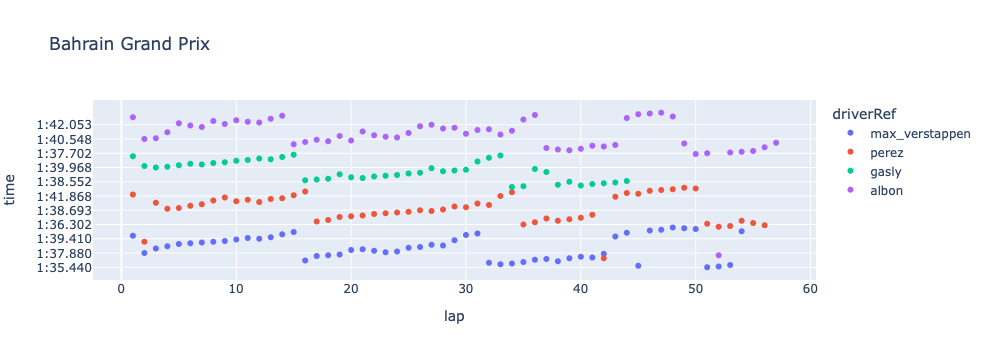

In [82]:
## Testing 
df_2022_F_BAH = df_2022[(df_2022['name'] == 'Bahrain Grand Prix')]
df_2022_BAH = df_2022_F_BAH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_BAH = df_2022_BAH.sort_values(by="time")
df_2022_BAH = df_2022_BAH.sort_values(by="time")
fig_2022_1 = px.scatter(df_2022_BAH, x="lap", y="time", color = "driverRef", title = "Bahrain Grand Prix")
fig_2022_1.update_traces(textposition="bottom right")
fig_2022_1.show()

#fig_2022_1 = px.line(df_2022_BAH, x="lap", y="milliseconds", color='driverRef', markers=True)
#fig_2022_1.update_traces(textposition="bottom right")
#fig_2022_1.show()

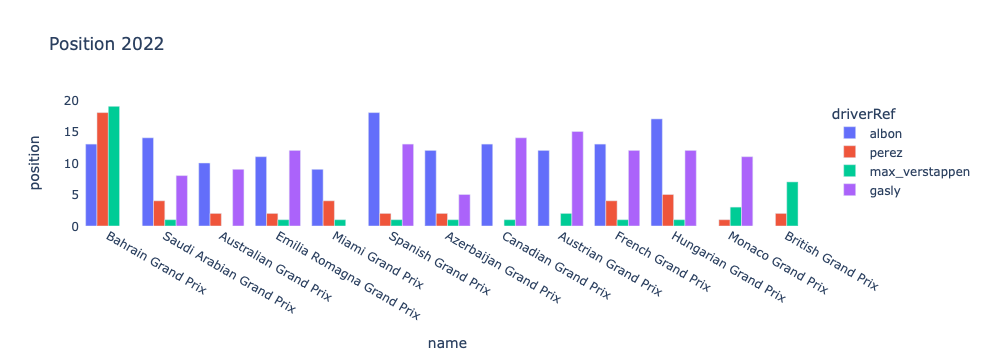

In [27]:
# Positions 2022
df_results_2022 = df_results[(df_results['year']==2022)&((df_results['code']=='VER')|(df_results['code']=='GAS')|(df_results['code']=='ALB')|(df_results['code']=='PER'))]

fig = px.bar(df_results_2022, x='name', y='position'
             #,hover_data=['driverRef', 'position']
             , color='driverRef', height=100,barmode='group', title = 'Position 2022')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

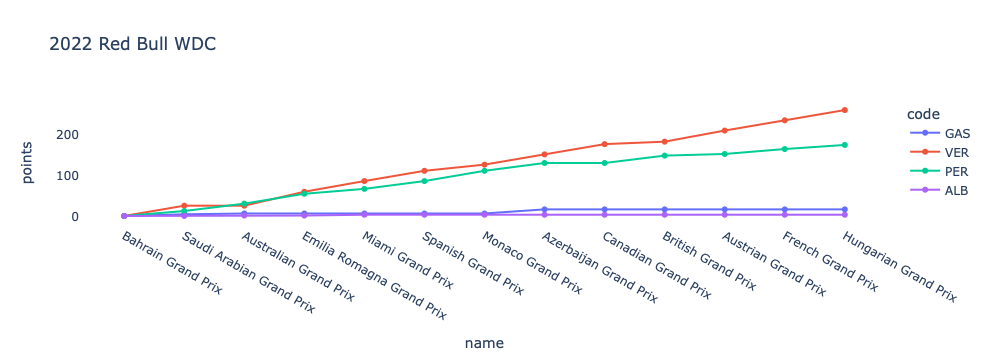

In [83]:
season_Points_2022_ = season_Points_2022.query("code in ['GAS', 'VER','ALB','PER']")
season_Points_2022_ = season_Points_2022.sort_values(by="date")
fig = px.line(season_Points_2022_, x='name', y='points', color='code', markers=True, title = '2022 Red Bull WDC')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [84]:
# TESTING
#df_2022_BAH1 =  df_2022_BAH
#df_2022_BAH1.time.astype('int64')
#df_2022_BAH1.info()

In [ ]:
# New generation 
# Drivers:

# George Russel 2019 Williams 2022 Mercedes

# Pierre Gasly 2017-18 toro roso 2019 Red Bull + toro roso with danill

# Lando Norris 2019 mclaren

# Zhou 2022 sauber alfa romeo

# Mick Schumacher 2021 haas 

# Charles Leclerc 2018 sauber alfa romeo 2019 Ferrari

# Yuki Tsunoda 2021 alpha tauri

# Max Verstappen 2015 toro roso 2016 Red Bull Racing

# Alexander Albon 2019 Toro roso + 2020 Red bull 2022 Williams




# 2019  Russel vs Alex vs Lando 
# 2018  Pierre vs Charles 
# 2021  Mick vs Yuki
# Max vs RB drivers 

In [35]:
#fig_2022_01 = px.bar(df_2022, x="driverRef", y="position", color="driverRef", title="Australian Grand Prix")
#fig_2022_01.show()

In [36]:
#fig = px.bar(df_2022, x='name', y='position',
 #            hover_data=['driverRef', 'position'], color='driverRef',
  #           labels={'pop':'position'}, height=400)
#fig.show()


In [42]:
# NÃO

#df_driver_standings = driver_standings.head()
#df_driver_standings = df_driver_standings.merge(drivers[['driverId','code','driverRef']],how='left',on='driverId')
#df_driver_standings = df_driver_standings.merge(races[['raceId','name','date','year']],how='left',on='raceId')
#df_driver_standings.head()
#df_driver_standings = df_driver_standings[(df_driver_standings['year']==2019)&((df_driver_standings['code']=='VER')|(df_driver_standings['code']=='GAS'))]
#df_driver_standings.sort_values(['date'],inplace=True)

#df_results[(df_results['year']==2019)&((df_results['code']=='VER')|(df_results['code']=='GAS')|(df_results['code']=='ALB')|(df_results['code']=='PER'))]

#sns.lineplot(data=df_driver_standings,x='name', y='points',hue='code',marker='.',palette=['black','orange'])
#plt.tight_layout()
#plt.xticks(rotation=90)
#plt.show()
#df_driver_standings.head()

In [85]:
# Line graph 
#fig = px.line(a2, x="name", y="points", title='2019 WDC')
#fig.show()

In [86]:
#pit_stops

In [57]:
b5 = pit_stops
b5 = pit_stops.merge(drivers[['driverId','code','driverRef']], how = 'left', on = 'driverId')
b6 = b5.merge(races[['raceId','name','date','year']],how='left',on='raceId')
b7 = b6
b7 = b6[(b6['year']==2019)&((b6['code']=='VER')|(b6['code']=='GAS')|(b6['code']=='ALB'))]
b8 = b7
b8['duration'] = b8['milliseconds']/1000
b8[b8['duration']<40].groupby(['code']).mean()['duration']

data25 = b8[b8['duration']<40].groupby(['name','code']).mean().reset_index()
#data25

fig25 = px.bar(data25, x='duration', y='name'
             ,hover_data=['driverRef', 'position']
               , color='code', height=1000,barmode='group')
fig25.show()
#b7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 93 entries, 6794 to 7425
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   raceId        93 non-null     int64  
 1   driverId      93 non-null     int64  
 2   stop          93 non-null     int64  
 3   lap           93 non-null     int64  
 4   time          93 non-null     object 
 5   duration      93 non-null     float64
 6   milliseconds  93 non-null     int64  
 7   code          93 non-null     object 
 8   driverRef     93 non-null     object 
 9   name          93 non-null     object 
 10  date          93 non-null     object 
 11  year          93 non-null     int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 9.4+ KB


/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_4030/3504525125.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [153]:
c5 = qualifying
c6 = c5.merge(drivers[['driverId','code','driverRef']],how='left',on='driverId')
c7 = c6.merge(races[['raceId','name','date','year']],how='left',on='raceId')
c8 = c7[(c7['year']==2021)&((c7['code']=='VER')|(c7['code']=='GAS'))]

c9 = c8.copy()

c9.rename(columns={'position':'start_position'},inplace=True)
cfirst = df_laps[df_laps['lap']==1]
c10 = c9.merge(cfirst[['raceId','driverId','lap position']],on=['raceId','driverId'],how='left')
c10.rename(columns={'lap position':'lap_1_position'}, inplace=True)
c11 = c10.merge(results[['raceId','driverId','position']],on=['raceId','driverId'],how='left')
c11.rename(columns={'position':'final_position'},inplace=True)
#c11['Start to Lap 1']= -c11['lap 1 position'] + c11['start position']
#c11['Qualifying conversion']= -c11['final position'] + c11['start position']
#c11['Lap 1 conversion']= -c11['final position'] + c11['lap 1 position']

#c11.final_postion = positions.final_positio.astype('int64')
#a = a[a.position != '\\N']
#b = a[a['position'] == '1']
#b
#pd.to_numeric(c11['final position'])
c11['final_position'] = c11['final_position'].replace(['\\N'], '21')
c11.start_position = c11.start_position.astype('int64')
c11.lap_1_position = c11.lap_1_position.astype('int64')
c11.final_position = c11.final_position.astype('int64')
c11['Start_to_Lap_1']= -c11['lap_1_position'] + c11['start_position']
c11['Qualifying_conversion']= -c11['final_position'] + c11['start_position']
c11['Lap_1_conversion']= -c11['final_position'] + c11['lap_1_position']
c11.head()
c11.groupby(['code']).mean()[['Start_to_Lap_1','Qualifying_conversion','Lap_1_conversion']]
c11.info()
#fig50 = px.bar(c11, x='Start to Lap 1', y='name'
             #,hover_data=['driverRef', 'position']
 #            , color='code', height=1000,barmode='group')
#fig50.show()
#c11['final_postion'] = c11['final_postion'].replace(['\\N'], '21')

IntCastingNaNError: Cannot convert non-finite values (NA or inf) to integer

In [78]:
df_qualifying = pd.read_csv('/kaggle/input/formula-1-world-championship-1950-2020/qualifying.csv')
df_qualifying = df_qualifying.merge(df_drivers[['driverId','code','driverRef']],how='left',on='driverId')
df_qualifying = df_qualifying.merge(df_races[['raceId','name','date','year']],how='left',on='raceId')
df_qualifying = df_qualifying[(df_qualifying['year']==2021)&((df_qualifying['code']=='VER')|(df_qualifying['code']=='HAM'))]

df_conversions = df_qualifying.copy()
df_conversions.rename(columns={'position':'start position'},inplace=True)
df_first_lap = df_laps[df_laps['lap']==1]
df_conversions = df_conversions.merge(df_first_lap[['raceId','driverId','lap position']],on=['raceId','driverId'],how='left')
df_conversions.rename(columns={'lap position':'lap 1 position'}, inplace=True)
df_conversions = df_conversions.merge(df_results[['raceId','driverId','position']],on=['raceId','driverId'],how='left')
df_conversions.rename(columns={'position':'final position'},inplace=True)
df_conversions['Start to Lap 1']= -df_conversions['lap 1 position'] + df_conversions['start position']
df_conversions['Qualifying conversion']= -df_conversions['final position'] + df_conversions['start position']
df_conversions['Lap 1 conversion']= -df_conversions['final position'] + df_conversions['lap 1 position']

df_conversions.head()

df_conversions.groupby(['code']).mean()[['Start to Lap 1','Qualifying conversion','Lap 1 conversion']]

fig50 = px.bar(data25, x='duration', y='name'
             #,hover_data=['driverRef', 'position']
             , color='code', height=1000,barmode='group')
fig25.show()

sns.barplot(data=df_conversions,
            y='name', 
            x='Start to Lap 1',
            hue='code',
            palette=['orange','black'])
plt.tight_layout()
plt.xticks(rotation=90)
plt.show()

sns.barplot(data=df_conversions,
            y='name', 
            x='Qualifying conversion',
            hue='code',
            palette=['orange','black'])
plt.tight_layout()
plt.xticks(rotation=90)
plt.show()

sns.barplot(data=df_conversions,
            y='name', 
            x='Lap 1 conversion',
            hue='code',
            palette=['orange','black'])
plt.tight_layout()
plt.xticks(rotation=90)
plt.show()


ValueError: cannot reindex from a duplicate axis

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90 entries, 0 to 89
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   raceId        90 non-null     int64  
 1   driverId      90 non-null     int64  
 2   stop          90 non-null     int64  
 3   lap           90 non-null     int64  
 4   time          90 non-null     object 
 5   duration      90 non-null     float64
 6   milliseconds  90 non-null     int64  
 7   code_x        90 non-null     object 
 8   driverRef_x   90 non-null     object 
 9   name_x        90 non-null     object 
 10  date_x        90 non-null     object 
 11  year_x        90 non-null     int64  
 12  code_y        90 non-null     object 
 13  driverRef_y   90 non-null     object 
 14  name_y        90 non-null     object 
 15  date_y        90 non-null     object 
 16  year_y        90 non-null     int64  
dtypes: float64(1), int64(7), object(9)
memory usage: 12.7+ KB
